<a href="https://colab.research.google.com/github/tonydrabeck/219project4/blob/main/ECE219_Project_4_(5).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ECE219 Project 4

In [1]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)
project_dir = 'drive/MyDrive/ECE219/project4/'

Mounted at /content/drive


# PART I: Regression Analysis and Define Your Own Task!

In [2]:
!pip install ucimlrepo
!pip install ydata_profiling
!pip install scikit-optimize

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 14.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 32.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=41e09c4159f9a4c12b793afd7f260ed76824369df706f7a4fb0bced81ced6b93
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 1.3 MB/s eta 0:00:00


In [3]:
import datetime
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import re
import seaborn as sns
import ssl
import statsmodels.api as sm
import lightgbm as lgb

from scipy.stats import linregress
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_squared_error, accuracy_score, classification_report
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV, train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures, PowerTransformer, StandardScaler
from sklearn.tree import plot_tree
from sklearn.pipeline import Pipeline
from ucimlrepo import fetch_ucirepo
from ydata_profiling import ProfileReport
from skopt import BayesSearchCV

## 2. Datasets

### Dataset 1: Diamond Characteristics

This dataset contains information about 150000 round-cut diamonds. There are 14 variables (features) and for each sample, these features specify the various properties of the sample. Below we describe some of these features:

* carat: weight of the diamond
* cut: quality of the cut
* clarity: measured diamond clarity
* length: measured length in mm
* width: measured width in mm
* depth: measured depth in mm
* depth percent: diamond’s total height divided by it’s total width
* table percent: width of top of diamond relative to widest point
* gridle min: refers to the thinnest part of the girdle
* gridle max: refers to the thickest part of the girdle

In addition to these features, there is the target variable: i.e what we would like to predict:

* price: price in US dollars

In [ ]:
dia_df = pd.read_csv(project_dir + "diamonds_ece219.csv", index_col=0)
dia_df.head(5)

,color,clarity,carat,cut,symmetry,polish,depth_percent,table_percent,length,width,depth,girdle_min,girdle_max,price
0,E,VVS2,0.09,Excellent,Very Good,Very Good,62.7,59.0,2.85,2.87,1.79,M,M,200
1,E,VVS2,0.09,Very Good,Very Good,Very Good,61.9,59.0,2.84,2.89,1.78,STK,STK,200
2,E,VVS2,0.09,Excellent,Very Good,Very Good,61.1,59.0,2.88,2.90,1.77,TN,M,200
3,E,VVS2,0.09,Excellent,Very Good,Very Good,62.0,59.0,2.86,2.88,1.78,M,STK,200
4,E,VVS2,0.09,Very Good,Very Good,Excellent,64.9,58.5,2.79,2.83,1.82,STK,STK,200


In [ ]:
dia_X = dia_df[[c for c in dia_df.columns if c != "price"]]
dia_y = dia_df[["price"]]

### Dataset 2: Wine Quality Dataset

The two datasets are related to red and white variants of the Portuguese ”Vinho Verde” wine. This dataset comprises 4, 898 instances for white wine and 1599 instances for red wine, with 13 features for each instance.

In [4]:
# Ignore ssl certificate verification
ssl._create_default_https_context = ssl._create_unverified_context

# fetch dataset
wine_quality = fetch_ucirepo(id=186)

# # data (as pandas dataframes)
# wine_X = wine_quality.data.features
# wine_y = wine_quality.data.targets

wine_df = wine_quality.data.original.copy()

wine_X = wine_df[[c for c in wine_df.columns if c not in wine_quality.metadata["target_col"]]]
wine_y = wine_quality.data.targets

# metadata
print(wine_quality.metadata)

# variable information
print(wine_quality.variables)

{'uci_id': 186, 'name': 'Wine Quality', 'repository_url': 'https://archive.ics.uci.edu/dataset/186/wine+quality', 'data_url': 'https://archive.ics.uci.edu/static/public/186/data.csv', 'abstract': 'Two datasets are included, related to red and white vinho verde wine samples, from the north of Portugal. The goal is to model wine quality based on physicochemical tests (see [Cortez et al., 2009], http://www3.dsi.uminho.pt/pcortez/wine/).', 'area': 'Business', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Multivariate'], 'num_instances': 4898, 'num_features': 11, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['quality'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Wed Nov 15 2023', 'dataset_doi': '10.24432/C56S3T', 'creators': ['Paulo Cortez', 'A. Cerdeira', 'F. Almeida', 'T. Matos', 'J. Reis'], 'intro_paper': {'title': 'Modeling wine preferences by data mining from physicoc

## 3. Required Steps
Follow these steps to process either of the datasets in Section 2.

### 3.1. Before Training

#### 3.1.1. Handling Categorical Features

A categorical feature is a feature that can take on one of a limited number of possible values. If one dataset contains categorical features, a preprocessing step needs to be carried to convert categorical variables into numbers and thus prepared for training.

One method for numerical encoding of categorical features is to assign a scalar. For instance, if we have a “Quality” feature with values {Poor, Fair, Typical, Good, Excellent} we might replace them with numbers 1 through 5. If there is no numerical meaning behind categorical features (e.g. {Cat, Dog}) one has to perform “one-hot encoding” instead.

In [ ]:
display(dia_X.head(5))
display(wine_X.head(5))

,color,clarity,carat,cut,symmetry,polish,depth_percent,table_percent,length,width,depth,girdle_min,girdle_max
0,E,VVS2,0.09,Excellent,Very Good,Very Good,62.7,59.0,2.85,2.87,1.79,M,M
1,E,VVS2,0.09,Very Good,Very Good,Very Good,61.9,59.0,2.84,2.89,1.78,STK,STK
2,E,VVS2,0.09,Excellent,Very Good,Very Good,61.1,59.0,2.88,2.90,1.77,TN,M
3,E,VVS2,0.09,Excellent,Very Good,Very Good,62.0,59.0,2.86,2.88,1.78,M,STK
4,E,VVS2,0.09,Very Good,Very Good,Excellent,64.9,58.5,2.79,2.83,1.82,STK,STK


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,red


In [5]:
def encode_and_bind(df, feature_to_encode, drop_original=True):
    dummies = pd.get_dummies(df[[feature_to_encode]], dtype=int)
    res = pd.concat([df, dummies], axis=1)
    if drop_original:
      res = res.drop([feature_to_encode], axis=1)
    return res

wine_df_encoded = encode_and_bind(wine_df, "color")
wine_X_encoded = encode_and_bind(wine_X, "color")
display(wine_df_encoded.head(5))
display(wine_X_encoded.head(5))

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color_red,color_white
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1,0


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,color_red,color_white
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,1,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,1,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,1,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,1,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,1,0


#### 3.1.2. Data Inspection

For exploratory data analysis, one can try pandas-profiling

https://github.com/pandas-profiling/pandas-profiling

In [ ]:
prof = ProfileReport(
    wine_df_encoded,
    title="Profiling Report",
    correlations={
    "auto": {"calculate": False},
    "pearson": {"calculate": True},
    # "spearman": {"calculate": False},
    # "kendall": {"calculate": False},
    # "cramers": {"calculate": False},
    # "phi_k": {"calculate": False},
    },
    missing_diagrams=None,
    samples=None,
    # interactions=None,
    # duplicates=None,
)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

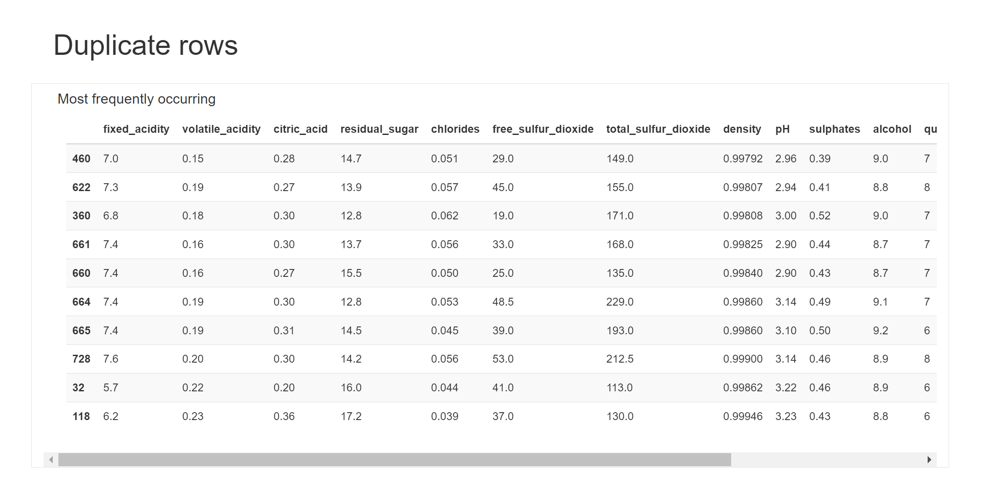

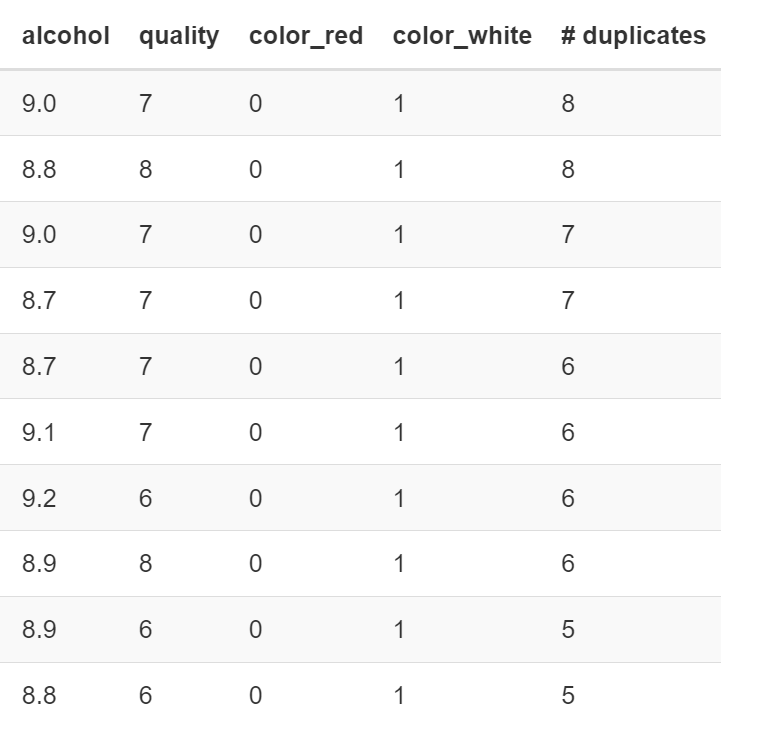

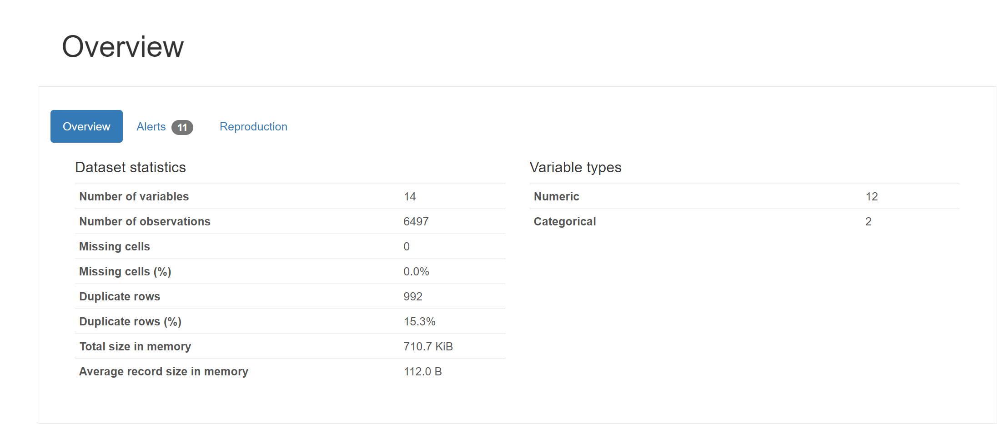

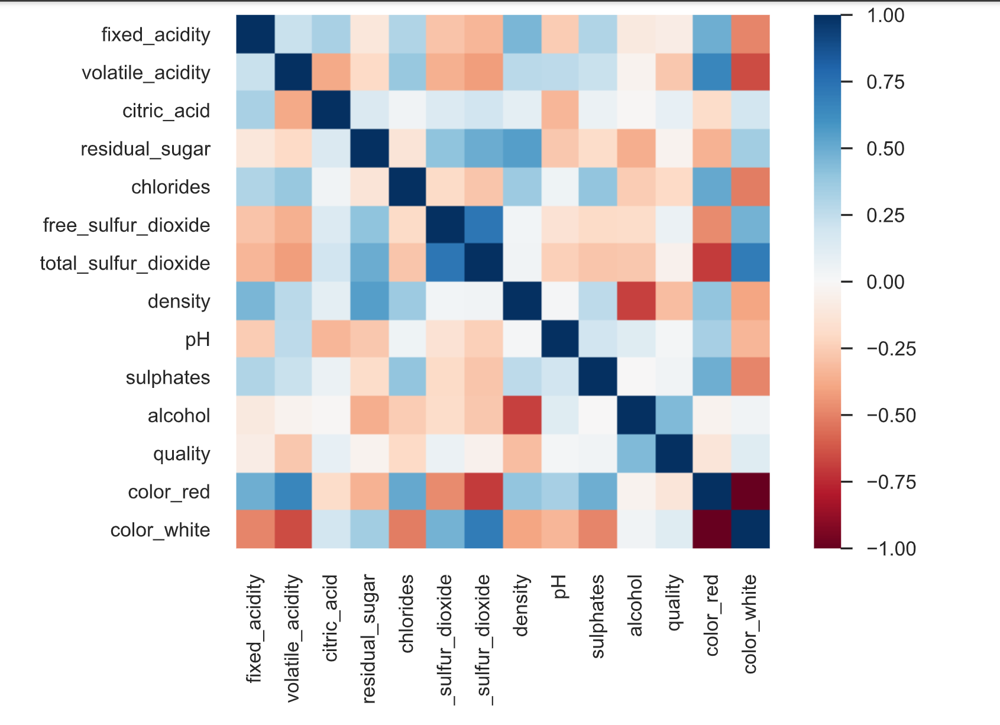

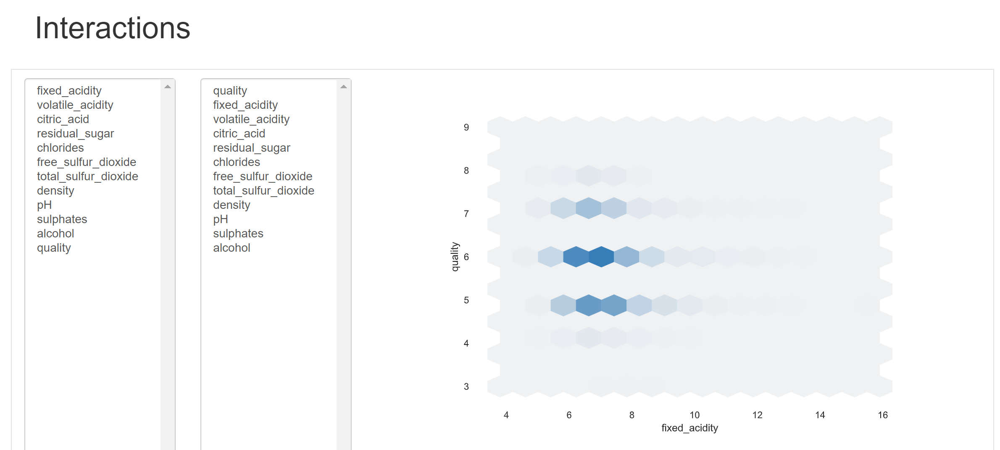

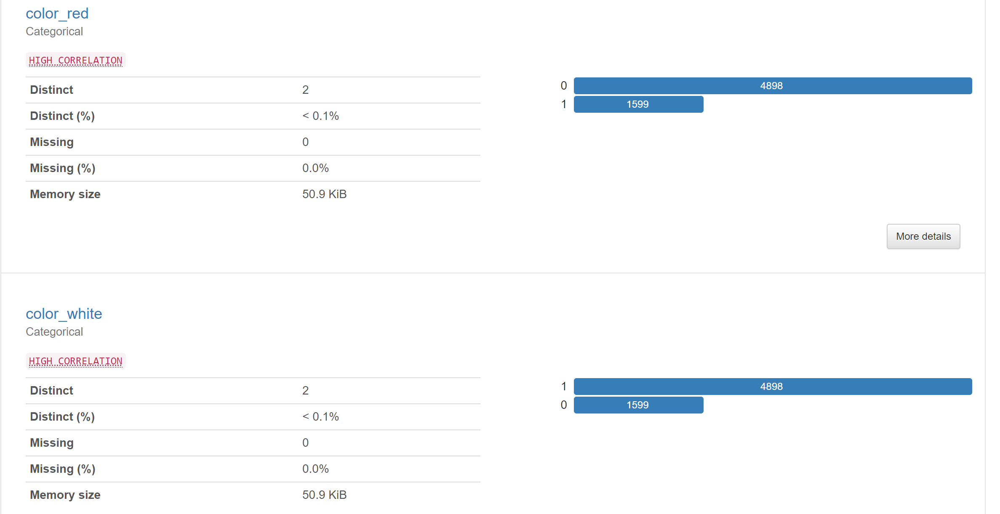

##### Question 1.1.

Plot a heatmap of the Pearson correlation matrix of the dataset columns. Report which features have the highest absolute correlation with the target variable. In the context of either dataset, describe what the correlation patterns suggest.

*Referring to the "Correlations" tab of the report above, alcohol (0.444), density (-0.306) and volatile acidity (-0.266) are the features with the highest absolute correlation with quality of wine in the decreasing order.*

##### Question 1.2.

Plot the histogram of numerical features. What preprocessing can be done if the distribution of a feature has high skewness?

*Refer to the "Variables" tab of the report above for the histograms.*

*We can typically perform log transform for right-skewed data (positive skew) and square transform for left-skewed data (negative skew). We tried to apply Yeo-Johnson tramsform using `PowerTransformer`, which can be used for any distribution (both positive and negative skew), and in general normalize better than log or square transforms. We also set `standardize=True`, which has the same effect as `StandardScaler` by standardizing the data.*

In [8]:
numerical_features = [c for c in wine_X.columns if c != "color"]
categorical_features = ["color"]
# Skew function of Pandas
old_skew = wine_X[numerical_features].skew().sort_values(ascending=False)
old_skew

chlorides               5.399828
sulphates               1.797270
fixed_acidity           1.723290
volatile_acidity        1.495097
residual_sugar          1.435404
free_sulfur_dioxide     1.220066
alcohol                 0.565718
density                 0.503602
citric_acid             0.471731
pH                      0.386839
total_sulfur_dioxide   -0.001177
dtype: float64

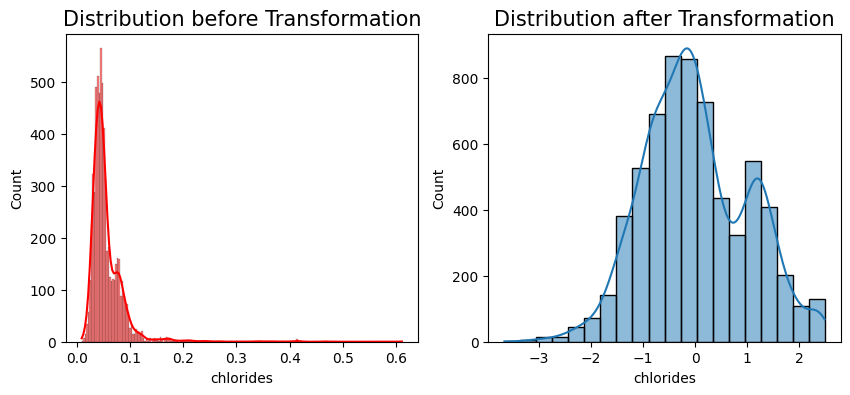

Skewness was 5.4 before & is 0.19 after Yeo-johnson transformation.




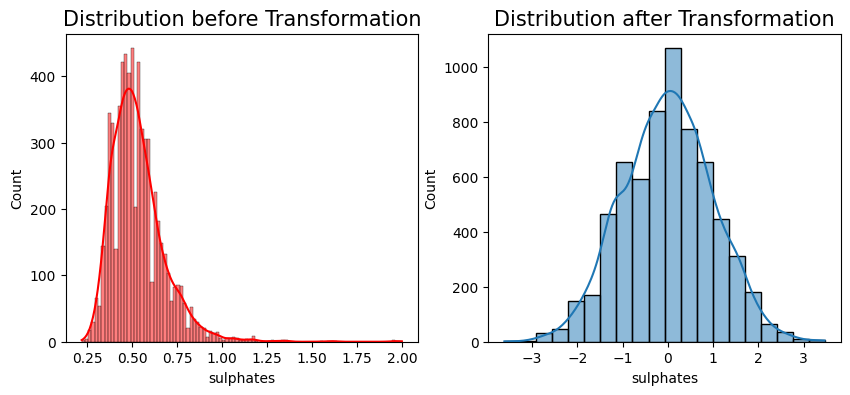

Skewness was 1.8 before & is 0.01 after Yeo-johnson transformation.




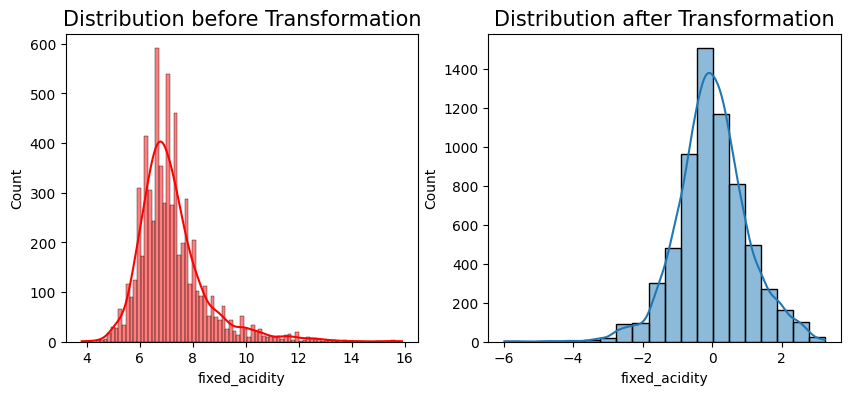

Skewness was 1.72 before & is -0.06 after Yeo-johnson transformation.




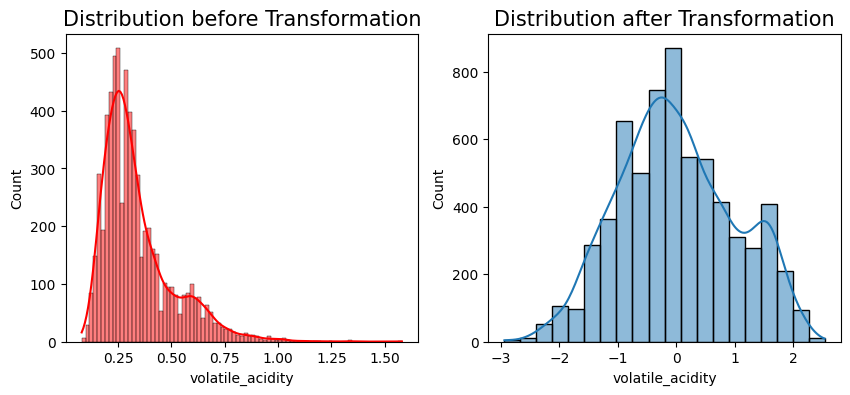

Skewness was 1.5 before & is 0.11 after Yeo-johnson transformation.




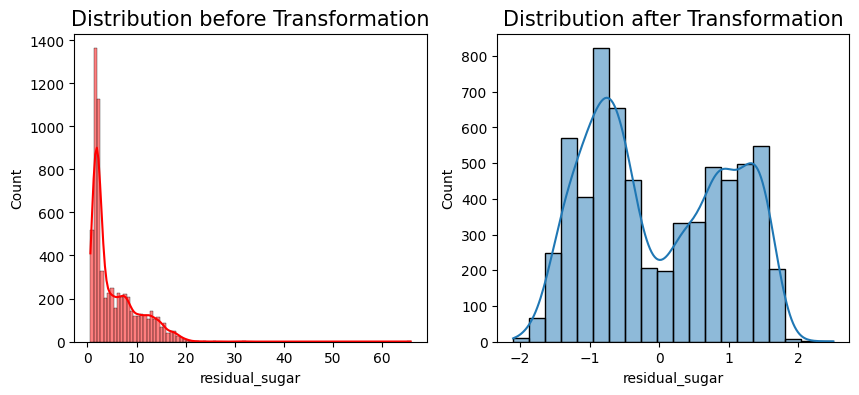

Skewness was 1.44 before & is 0.14 after Yeo-johnson transformation.




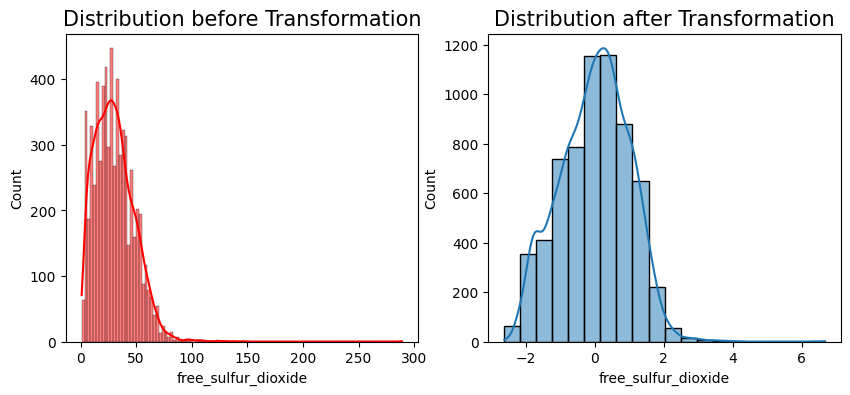

Skewness was 1.22 before & is -0.04 after Yeo-johnson transformation.




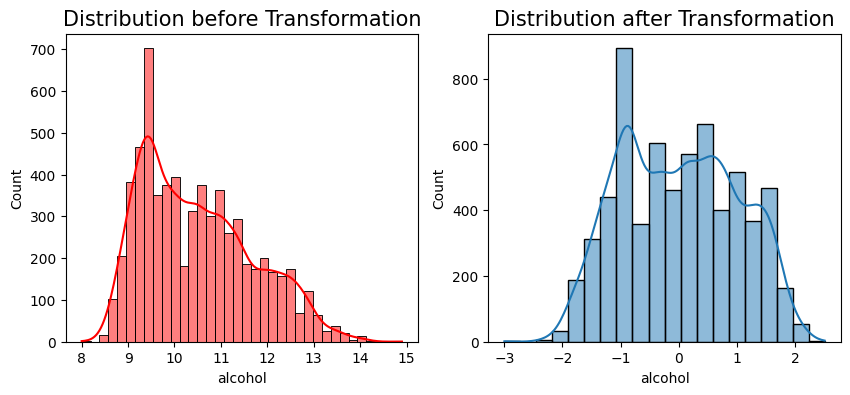

Skewness was 0.57 before & is 0.07 after Yeo-johnson transformation.




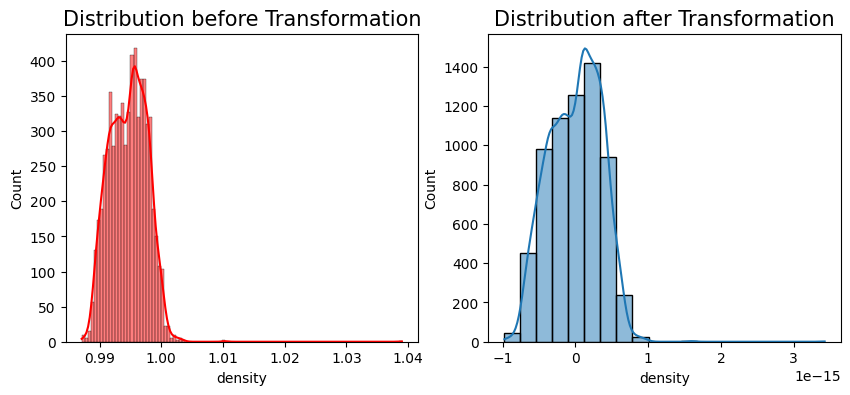

Skewness was 0.5 before & is 0 after Yeo-johnson transformation.




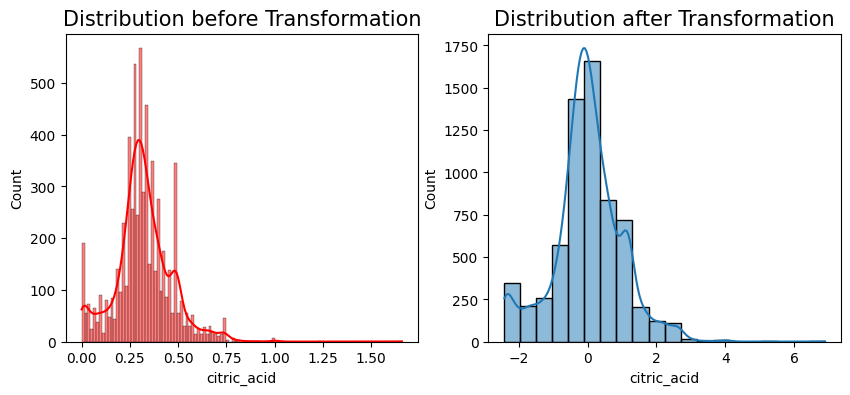

Skewness was 0.47 before & is 0.01 after Yeo-johnson transformation.




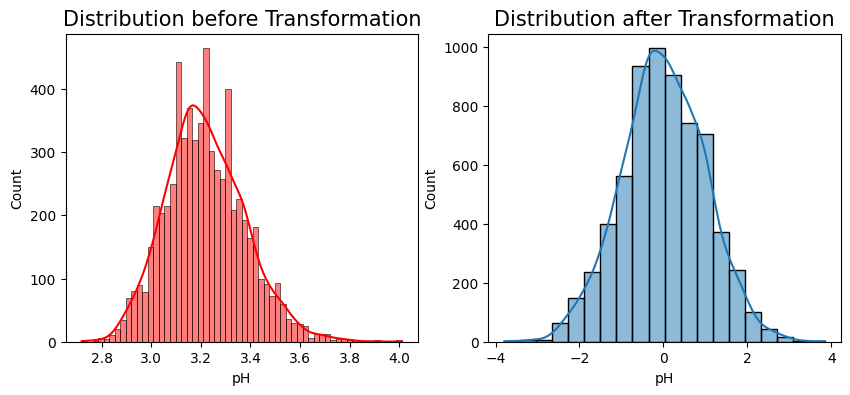

Skewness was 0.39 before & is -0.0 after Yeo-johnson transformation.


total_sulfur_dioxide has the skewness within the threshold and transform will not be applied.




In [9]:
def yeojohntrans(df: pd.DataFrame, feature: str):   # function to apply transformer and check the distribution with histogram and kdeplot

    yeojohnTr = PowerTransformer(standardize=True)   # not using method attribute as yeo-johnson is the default

    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.title("Distribution before Transformation", fontsize=15)
    sns.histplot(df[feature], kde=True, color="red")
    plt.subplot(1,2,2)

    df_yeojohn = pd.DataFrame(yeojohnTr.fit_transform(df[feature].values.reshape(-1,1)))
    plt.title("Distribution after Transformation", fontsize=15)
    sns.histplot(df_yeojohn, bins=20, kde=True, legend=False)
    plt.xlabel(feature)
    plt.show()

    print(f"Skewness was {round(old_skew[feature],2)} before & is {round(df_yeojohn.skew()[0],2)} after Yeo-johnson transformation.\n\n")

    df_transformed = df.copy()
    df_transformed[feature] = df_yeojohn
    return df_transformed

wine_X_transformed = wine_X.copy()
for feature, skew in old_skew.items():
    if abs(skew) >= 0.1:
        wine_X_transformed = yeojohntrans(df=wine_X_transformed, feature=feature)
    else:
        print(f"{feature} has the skewness within the threshold and transform will not be applied.\n\n")

##### Question 1.3.

Construct and inspect the box plot of categorical features vs target variable. What do you find?

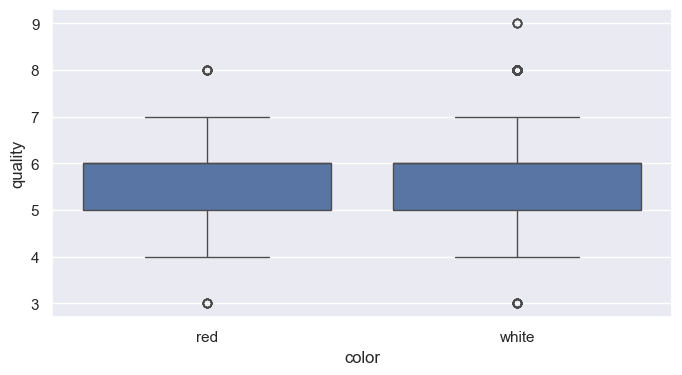

In [ ]:
sns.set_theme(rc={'figure.figsize':(8,4)})
ax = sns.boxplot(x="color", y="quality", data=wine_df)

*While there are significantly more data for white wine than red wine, the distribution of the data within each category is fairly similar with majority of the data having the quality score between 5 and 6. There are more extreme values present for white wine dataset.*

##### Question 1.4.

For the Diamonds dataset, plot the counts by color, cut and clarity

**OR**

For the wine quality dataset, plot histogram for quality scores.

*Refer to "quality" under "Variables" tab in the report above. The quality scores are quite centrally distributed with 7 unique values available. This is in line with the observation made from the box plot in Question 1.3. across two categorical values (red and white colors).*

#### 3.1.3. Standardization

Standardization of datasets is a common requirement for many machine learning estimators; they might behave badly if the individual features do not more-or-less look like standard normally distributed data: Gaussian with zero mean and unit variance. If a feature has a variance that is orders of magnitude larger than others, it might dominate the objective function and make the estimator unable to learn from other features cor- rectly as expected.


##### Question 2.1.

Standardize feature columns and prepare them for training.

https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

*`PowerTransformer(standardize=True)` includes the effect of `StandardScaler()` while lowering absolute skewness, so we will use `PowerTransformer` for numerical features and `OneHotEncoder` for categorical features.*

In [10]:
pipeline=ColumnTransformer([
    ('num', PowerTransformer(standardize=True), numerical_features),
    ('cat', OneHotEncoder(), categorical_features),
])

X = pipeline.fit_transform(wine_X)
feature_names = pipeline.get_feature_names_out()
X_features = {feature:i for i, feature in enumerate(feature_names)}
X_df = pd.DataFrame(X, columns=feature_names)
y = wine_y.values.ravel()

display(X_features)
display(X)
display(y)

{'num__fixed_acidity': 0,
 'num__volatile_acidity': 1,
 'num__citric_acid': 2,
 'num__residual_sugar': 3,
 'num__chlorides': 4,
 'num__free_sulfur_dioxide': 5,
 'num__total_sulfur_dioxide': 6,
 'num__density': 7,
 'num__pH': 8,
 'num__sulphates': 9,
 'num__alcohol': 10,
 'cat__color_red': 11,
 'cat__color_white': 12}

array([[ 0.35500882,  1.76807414, -2.41123961, ..., -0.94321527,
         1.        ,  0.        ],
       [ 0.66438364,  2.07947101, -2.41123961, ..., -0.50030206,
         1.        ,  0.        ],
       [ 0.66438364,  1.88952954, -2.07072261, ..., -0.50030206,
         1.        ,  0.        ],
       ...,
       [-0.50515946, -0.57020818, -0.88167161, ..., -0.94321527,
         0.        ,  1.        ],
       [-1.8463886 , -0.09695535, -0.08491222, ...,  1.67065438,
         0.        ,  1.        ],
       [-1.11263878, -0.90246239,  0.46081226, ...,  1.11691955,
         0.        ,  1.        ]])

array([5, 5, 5, ..., 6, 7, 6])

#### 3.1.4. Feature Selection

* `sklearn.feature_selection.mutual_info_regression_function` returns estimated mutual information between each feature and the label. Mutual information (MI) between two random variables is a non-negative value which measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.
* `sklearn.feature_selection.f_regression` function provides F scores, which is a way of comparing the significance of the improvement of a model, with respect to the addition of new variables.

##### Question 2.2.

You **may** use these functions to select features that yield better regression results (especially in the classical models). Describe how this step qualitatively affects the performance of your models in terms of test RMSE. Is it true for all model types? Also list two features for either dataset that has the lowest MI w.r.t to the target.

From this point on, you are free to use any combination of features, as long as the performance on the regression model is on par (or slightly worse) than the Neural Network model.

In [ ]:
mir = mutual_info_regression(X, y, discrete_features=[11, 12], random_state=0)
pd.Series({feature: mi for feature, mi in zip(X_features.keys(), mir)}).sort_values(ascending=False)

num__alcohol                 0.164178
num__chlorides               0.068775
num__volatile_acidity        0.064530
num__total_sulfur_dioxide    0.062597
num__residual_sugar          0.052847
num__citric_acid             0.041766
num__free_sulfur_dioxide     0.025748
num__fixed_acidity           0.025547
num__sulphates               0.025223
cat__color_red               0.011410
cat__color_white             0.011410
num__pH                      0.008760
num__density                 0.007095
dtype: float64

In [ ]:
f_statistic, p_values = f_regression(X, y)
print("\nF-statitsics:")
print(pd.Series({feature: f for feature, f in zip(X_features.keys(), f_statistic)}).sort_values(ascending=False))
print("\nP-values:")
print(pd.Series({feature: p for feature, p in zip(X_features.keys(), p_values)}).sort_values(ascending=False))


F-statitsics:
num__alcohol                 1467.599346
num__density                  712.343787
num__chlorides                548.271283
num__volatile_acidity         460.552039
cat__color_red                 93.811807
cat__color_white               93.811807
num__citric_acid               62.957664
num__fixed_acidity             61.109401
num__free_sulfur_dioxide       54.655522
num__total_sulfur_dioxide       7.565717
num__sulphates                  3.184423
num__pH                         3.035845
num__residual_sugar             0.603884
dtype: float64

P-values:
num__residual_sugar           4.371282e-01
num__pH                       8.149147e-02
num__sulphates                7.438988e-02
num__total_sulfur_dioxide     5.965376e-03
num__free_sulfur_dioxide      1.616882e-13
num__fixed_acidity            6.257003e-15
num__citric_acid              2.469463e-15
cat__color_white              4.888069e-22
cat__color_red                4.888069e-22
num__volatile_acidity         9.186396e

*Alcohol has the highest mutual information (0.1642), then chlorides (0.0688) followed by volatile acidity (0.0645). This means that alcohol gives 16.42% of the information about the quality of wine. pH (0.0088) and density (0.0071) on the other hand has the lowest MI w.r.t. the quality scores. By using a threshold of 1%, we can decide to exclude pH and density for the following regression analysis.*

*Based on the F-stats and P-values, alchogol, density and chlorides have the significant differences. On the other hand, residual sugar, pH and sulphates are likely to embed the differences that are random than statistically significant. We can safely exclude these three variables based on the threshold of p-value < 0.05.*

In [13]:
features_to_exclude = ["num__residual_sugar", "num__pH", "num__sulphates"]
X_features_selected = {feature: idx for feature, idx in X_features.items() if feature not in features_to_exclude}

X_selected = X[:, list(X_features_selected.values())]
X_selected.shape

(6497, 10)

### 3.2. Training

Once the data is prepared, we would like to train multiple algorithms and compare their performance using average RMSE from 10-fold cross-validation (please refer to part 3.3).

### 3.3. Evaluation

Perform 10-fold cross-validation and measure average RMSE errors for training and val- idation sets.

For random forest model, measure “Out-of-Bag Error” (OOB) as well.

#### 3.3.1. Linear Regression

What is the objective function? Train three models: (a) ordinary least squares (linear regression without regularization), (b) Lasso and (c) Ridge regression, and answer the following questions.



*   OLS = $\text{minimize} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$

*   Lasso = $\text{minimize} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \lambda \sum_{j=1}^{p} |\beta_j|$


*   Ridge = $\text{minimize} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \lambda \sum_{j=1}^{p} \beta_j^2$








In [11]:
models = {
    'OLS': LinearRegression(),
    'Lasso': Lasso(random_state=0),
    'Ridge': Ridge(random_state=0)
}

param_grid = {
    'Lasso': {'alpha': np.linspace(0.01, 100, 100)},
    'Ridge': {'alpha': np.linspace(0.01, 100, 100)}
}

kf = KFold(n_splits=10, shuffle=True, random_state=0)

def run_linear_regressions(X):
    results = {model_name: {'train_rmse': [], 'val_rmse': []} for model_name in models}

    for model_name, model in models.items():
        if model_name in param_grid:
            grid_search = GridSearchCV(model, param_grid[model_name], cv=kf, scoring='neg_mean_squared_error')
            grid_search.fit(X, y)
            best_model = grid_search.best_estimator_
            best_params = grid_search.best_params_
            print(f"Best parameters for {model_name}: {best_params}")
        else:
            best_model = model

        for train_index, val_index in kf.split(X):
            X_train, X_val = X[train_index], X[val_index]
            y_train, y_val = y[train_index], y[val_index]

            best_model.fit(X_train, y_train)
            y_train_pred = best_model.predict(X_train)
            y_val_pred = best_model.predict(X_val)

            train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
            val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

            results[model_name]['train_rmse'].append(train_rmse)
            results[model_name]['val_rmse'].append(val_rmse)

    average_rmse = {model_name: {'train_rmse': np.mean(res['train_rmse']), 'val_rmse': np.mean(res['val_rmse'])} for model_name, res in results.items()}

    for model_name, rmse in average_rmse.items():
        print(f"{model_name} - Train RMSE: {rmse['train_rmse']:.4f}, Validation RMSE: {rmse['val_rmse']:.4f}\n")

    average_rmse_df = pd.DataFrame(average_rmse).T
    print(average_rmse_df)


print("\nRunning Linear Regression without PowerTransform:")
run_linear_regressions(np.array(wine_X_encoded))

print("\nRunning Linear Regression after PowerTransform:")
run_linear_regressions(X)


Running Linear Regression without PowerTransform:
Best parameters for Lasso: {'alpha': 0.01}
Best parameters for Ridge: {'alpha': 0.01}
OLS - Train RMSE: 0.7323, Validation RMSE: 0.7334

Lasso - Train RMSE: 0.7441, Validation RMSE: 0.7448

Ridge - Train RMSE: 0.7342, Validation RMSE: 0.7352

       train_rmse  val_rmse
OLS      0.732267  0.733370
Lasso    0.744085  0.744805
Ridge    0.734212  0.735240

Running Linear Regression after PowerTransform:
Best parameters for Lasso: {'alpha': 0.01}
Best parameters for Ridge: {'alpha': 20.21}
OLS - Train RMSE: 0.7365, Validation RMSE: 0.7369

Lasso - Train RMSE: 0.7383, Validation RMSE: 0.7385

Ridge - Train RMSE: 0.7365, Validation RMSE: 0.7369

       train_rmse  val_rmse
OLS      0.736480  0.736878
Lasso    0.738296  0.738491
Ridge    0.736485  0.736874


##### Question 4.1.

Explain how each regularization scheme affects the learned parameter set.

*The **OLS** function does not contain any regularization parameters. This may cause certain features to have an unproportionate amount of weight within the trained models.*

***Lasso** adds the L1 penalty (sum of the absolute values of the feature coefficients).*
*This regularization methods yields to 0 and effectively performs feature selection. It may lead to sparse models where only a subset of the original features have non-zero coefficients. Model sparsity incereases as λ increases, meaning more coefficients are driven to zero. Lasso works best when we can identify multiple irrelevant features that should be minimized from the data.*

***Ridge** adds the L2 penalty (sum of the squared values of the coefficients).*
*This regularization method minimizes the coefficients very close to 0, but does not set them exactly to zero. The coefficients are reduced more towards zero as λ increases. This effect reduces their weight while simultaneously retaining the features within the model. Ridge works best when attempting to minimize multicollinearity amongst features.*

##### Question 4.2.

Report your choice of the best regularization scheme along with the optimal penalty parameter and explain how you computed it.

*`np.linspace` was implemented in order to capture the best alpha regularization term for L1 and L2. Instead of defining an array with a set number of regularization terms, a range of numbers between [0.01 , 100] was established. This helps expand the possibilities of finding the L1/L2 terms that best suit the data.*

##### Question 4.3.

Does feature standardization play a role in improving the model performance (in the cases with ridge regularization)? Justify your answer.

*The performance of Ridge regularization was worse after standardization with slightly higher RMSE. However, it may be in general preferred to standardize (where applicable) before running Ridge regularization to ensure the constistent scale of penalty because the model parameters for each feature has the same penalty value applied.*

##### Question 4.4.

Some linear regression packages return p-values for different features [2]. What is the meaning of these p-values and how can you infer the most significant features? A qualitative reasoning is sufficient.

[2] E.g: `scipy.stats.linregress and statsmodels.regression.linear model.OLS`

In [ ]:
p_values = pd.DataFrame(index=X_features, columns=['p_value'])

for feature, i in X_features.items():
    slope, intercept, r_value, p_value, std_err = linregress(X[:, i], y)
    p_values.loc[feature] = p_value

print("p-values of all the features in the wine dataset using scipy.stats.linregress:")
print(p_values)
print("\n")

p-values of all the features in the wine dataset using scipy.stats.linregress:
                            p_value
num__fixed_acidity              0.0
num__volatile_acidity           0.0
num__citric_acid                0.0
num__residual_sugar        0.437128
num__chlorides                  0.0
num__free_sulfur_dioxide        0.0
num__total_sulfur_dioxide  0.005965
num__density                    0.0
num__pH                    0.081491
num__sulphates              0.07439
num__alcohol                    0.0
cat__color_red                  0.0
cat__color_white                0.0




*`linregress` returns the same p-values as the ones returned via `f_regression` under Question 2.2, but with limited precision. As previously mentioned, residual sugar, pH and sulphates are likely to embed the differences that are not statistically significant (i.e. insignificant relationship with the target variable). Using the threshold of p-value < 0.05, we can decide to exclude these three variables.*

*When `f_regression` was used and returned p-values of higher precisions, we could also see that alcohol, density and chloride were the three variables with the highest significance in terms of p-values.*

#### 3.3.2. Polynomial Regression

Perform polynomial regression by crafting products of features you selected in part 3.1.4 up to a certain degree (max degree 6) and applying ridge regression on the compound features. You can use `scikit-learn` library to build such features. Avoid overfitting by proper regularization. Answer the following:

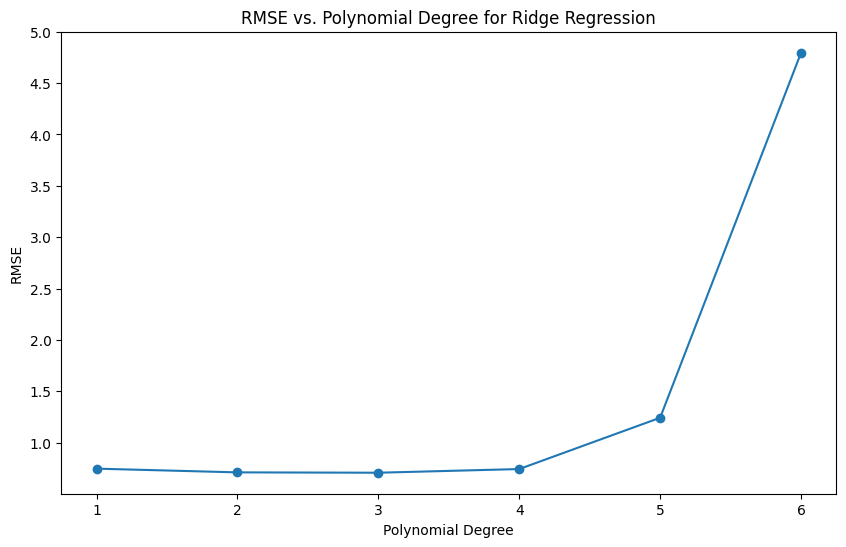

Optimal Polynomial Degree: 3
                                               Feature  Coefficient
8                                         num__alcohol     0.194646
254         num__total_sulfur_dioxide^2 cat__color_red     0.171760
5                             num__free_sulfur_dioxide     0.122993
246  num__free_sulfur_dioxide num__alcohol cat__col...     0.117043
279                      num__alcohol cat__color_red^2     0.106047
61                         num__alcohol cat__color_red     0.106047
154  num__volatile_acidity num__total_sulfur_dioxid...     0.102805
110  num__fixed_acidity num__total_sulfur_dioxide c...     0.098465
62                       num__alcohol cat__color_white     0.088599
281                    num__alcohol cat__color_white^2     0.088599
Optimal Polynomial Degree: 3


In [ ]:
def polynomial_ridge_regression(degree):
    poly = PolynomialFeatures(degree)
    X_poly = poly.fit_transform(X_selected)

    model = Ridge(alpha=10.0, solver='cholesky', random_state=0)
    kf = KFold(n_splits=10, shuffle=True, random_state=0)

    rmse_scores = cross_val_score(model, X_poly, y, scoring='neg_mean_squared_error', cv=kf)
    rmse_scores = np.sqrt(-rmse_scores)

    return np.mean(rmse_scores)

degrees = range(1, 7)
rmse_scores = [polynomial_ridge_regression(degree) for degree in degrees]

plt.figure(figsize=(10, 6))
plt.plot(degrees, rmse_scores, marker='o')
plt.xlabel('Polynomial Degree')
plt.ylabel('RMSE')
plt.title('RMSE vs. Polynomial Degree for Ridge Regression')
plt.show()

optimal_degree = degrees[np.argmin(rmse_scores)]
print(f"Optimal Polynomial Degree: {optimal_degree}")

poly = PolynomialFeatures(optimal_degree)
X_poly = poly.fit_transform(X_selected)

model = Ridge(alpha=10.0, solver='cholesky')
model.fit(X_poly, y)

coefficients = model.coef_
features = poly.get_feature_names_out(list(X_features_selected.keys()))

feature_importance = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
}).sort_values(by='Coefficient', ascending=False)

print(feature_importance.head(10))

print(f"Optimal Polynomial Degree: {optimal_degree}")

##### Question 5.1.

What are the most salient features? Why?

*The most salient features are those with the highest coefficient values. The feautures with bigger coefficient values means that they hold more weight within the polynomial regression. The following features are the ones with the highest coefficient values:*
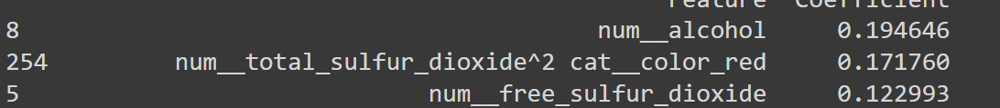

##### Qeustion 5.2.


What degree of polynomial is best? How did you find the optimal degree? What does a very high-order polynomial imply about the fit on the training data? What about its performance on testing data?

*Based on the reported RSME, the model will optimize it's error with degree of 3. If we keep increasing features, the data may start to overfit or the RSME will start increasing exponentially. This optimal degree was found setting the L2 regularization to 10 as many of the features had p-values below 0.05 which is used to determine their statistical significance.*

#### 3.3.3. Neural Network

You will train a multi-layer perceptron (fully connected neural network). You can simply use the `sklearn` implementation:

##### Question 6.1.

Adjust your network size (number of hidden neurons and depth), and weight decay as regularization. Find a good hyper-parameter set systematically (no more than 20 experiments in total).

In [ ]:
nn = MLPClassifier(random_state=0, max_iter=1000)
kf = KFold(n_splits=10, shuffle=True, random_state=0)

parameter_space = {
    'activation': ['relu', 'tanh'],
    'hidden_layer_sizes': [(7,), (5, 5), (3, 3, 3)],
    'alpha': [0.0001, 0.001, 0.05],
}

clf = GridSearchCV(nn, parameter_space, n_jobs=-1, cv=kf, scoring='neg_mean_squared_error')
clf.fit(X_selected, y) # X is train samples and y is the corresponding labels

best_model = clf.best_estimator_
best_params = clf.best_params_
print(f"Best parameters: {best_params}")

results = {"train_rmse": [], "val_rmse": []}
for train_index, val_index in kf.split(X_selected):
    X_train, X_val = X_selected[train_index], X_selected[val_index]
    y_train, y_val = y[train_index], y[val_index]

    best_model.fit(X_train, y_train)
    y_train_pred = best_model.predict(X_train)
    y_val_pred = best_model.predict(X_val)

    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

    results['train_rmse'].append(train_rmse)
    results['val_rmse'].append(val_rmse)

print(f"Train RMSE: {np.mean(results['train_rmse']):.4f}, Validation RMSE: {np.mean(results['val_rmse']):.4f}\n")

Best parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (5, 5)}
Train RMSE: 0.7603, Validation RMSE: 0.7646



##### Question 6.2.

How does the performance generally compare with linear regression? Why?

*MLP has higher RMSE than linear regression models.*

https://www.srs.fs.usda.gov/pubs/gtr/gtr_srs024/gtr_srs024_024.pdf

*pg.163: "Multiple linear regression performs better for low-variance problems and neural networks performs better for high-variance problems."*

##### Question 6.3.

What activation function did you use for the output and why? You may use none.

*Although 'relu' and 'tanh' were defined as activation functions within the neural network, GridSearchCV detected lower RMSE values when utilizing the 'relu' activation function. Generally speaking, 'relu' tends to converge faster (usually due to gradient computations). Since we are working with a deep neural network with more than two hidden layers, 'relu' can be expected to outperform the tanh activation function.*

##### Question 6.4.

What is the risk of increasing the depth of the network too far?

*Increasing the depth of a neural network will very likely cause overfitting when there is noise present, leading to decreased performance. It can also be computationally expensive as it increases RAM/memory utilization, yielding in longer execution times. The gradients of the neural network may also be distorted and negatively affect the overall learning process.*

#### 3.3.4. Random Forest

We will train a random forest regression model on datasets, and answer the following:
* Random forests have the following hyper-parameters:
  - Maximum number of features;
  - Number of trees;
  - Depth of each tree;

In [ ]:
rf = RandomForestRegressor(oob_score=True, random_state=0)
kf = KFold(n_splits=10, shuffle=True, random_state=0)

parameter_space = {
    'max_features': [1, 2, 3],
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
}

clf = GridSearchCV(rf, parameter_space, n_jobs=-1, cv=kf, scoring='neg_mean_squared_error')
clf.fit(X_selected, y)

rf_model = clf.best_estimator_
best_params = clf.best_params_
print(f"Best parameters: {best_params}")

oob_error = 1 - rf_model.oob_score_

train_rmse_list = []
val_rmse_list = []

for train_index, val_index in kf.split(X_selected):
    X_train, X_val = X_selected[train_index], X_selected[val_index]
    y_train, y_val = y[train_index], y[val_index]

    rf_model.fit(X_train, y_train)
    y_train_pred = rf_model.predict(X_train)
    y_val_pred = rf_model.predict(X_val)

    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

    train_rmse_list.append(train_rmse)
    val_rmse_list.append(val_rmse)

average_train_rmse = np.mean(train_rmse_list)
average_val_rmse = np.mean(val_rmse_list)

print(f"Random Forest - Out-of-Bag Error (OOB): {oob_error:.4f}")
print(f"Random Forest - Average Train RMSE: {average_train_rmse:.4f}")
print(f"Random Forest - Average Validation RMSE: {average_val_rmse:.4f}\n")

results = {
    'Out-of-Bag Error': [oob_error],
    'Average Train RMSE': [average_train_rmse],
    'Average Validation RMSE': [average_val_rmse]
}
results_df = pd.DataFrame(results, index=['Random Forest'])
print(results_df)

Best parameters: {'max_depth': None, 'max_features': 2, 'n_estimators': 200}
Random Forest - Out-of-Bag Error (OOB): 0.4618
Random Forest - Average Train RMSE: 0.2226
Random Forest - Average Validation RMSE: 0.6001

               Out-of-Bag Error  Average Train RMSE  Average Validation RMSE
Random Forest          0.461824            0.222597                 0.600052


##### Question 7.1.

Explain how these hyper-parameters affect the overall performance. Describe if and how each hyper-parameter results in a regularization effect during training.

***Max Features**: Balances between reducing overfitting with fewer features and improves tree performance with more features.*

***Number of Trees**: Balances stability and computational cost; more trees improve performance and act as regularization.*

***Depth of Trees**: Balances underfitting and overfitting; shallower trees limit complexity and reduce overfitting.*

##### Question 7.2.

How do random forests create a highly non-linear decision boundary despite the fact that all we do at each layer is apply a threshold on a feature?

Random forests create highly non-linear decision boundaries by combining multiple decision trees through ensemble learning. Each decision tree splits data based on thresholds, resulting in linear, axis-aligned boundaries in the feature space. A random forest consists of many decision trees. Each is trained on different bootstrap samples and using random feature subsets for splits. Predictions are aggregated through majority voting for classification and averaging for regression, which smooths out the decision boundary. While individual trees have piecewise linear boundaries, their combination results in a complex, non-linear boundary due to random feature selection and data sampling ensuring diverse tree splits. Individual trees exhibit high variance but low bias. However, averaging many trees reduces variance without significantly increasing bias. The ensemble effect acts as regularization, controlling overfitting and improving generalization.


##### Question 7.3.

Randomly pick a tree in your random forest model (with maximum depth of 4) and plot its structure. Which feature is selected for branching at the root node? What can you infer about the importance of this feature as opposed to others? Do the important features correspond to what you got in part 3.3.1?

*Alcohol is selected for branching at the root node. From the previous sections (3.3.1), this was the feature with the highest mutual information, highest f-statistics and lowest p-value, which infers that the most important feature was chosen for the root node.*

Random Forest - Out-of-Bag Error (OOB): 0.6982
Random Forest - Average Train RMSE: 0.7142
Random Forest - Average Validation RMSE: 0.7295
               Out-of-Bag Error  Average Train RMSE  Average Validation RMSE
Random Forest          0.698242            0.714213                 0.729456


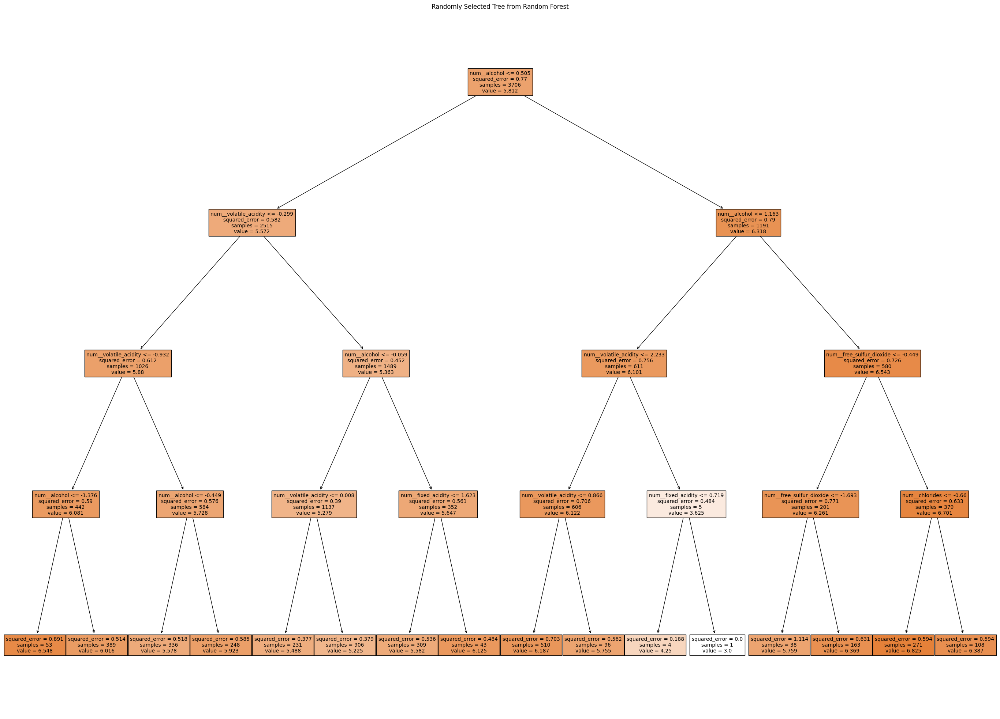

The feature selected for branching at the root node is: num__alcohol


In [17]:
rf_model = RandomForestRegressor(n_estimators=100, oob_score=True, max_depth=4, random_state=0)
rf_model.fit(X_selected, y)

oob_error = 1 - rf_model.oob_score_

kf = KFold(n_splits=10, shuffle=True, random_state=0)
train_rmse_list = []
val_rmse_list = []

for train_index, val_index in kf.split(X_selected):
    X_train, X_val = X_selected[train_index], X_selected[val_index]
    y_train, y_val = y[train_index], y[val_index]

    rf_model.fit(X_train, y_train)
    y_train_pred = rf_model.predict(X_train)
    y_val_pred = rf_model.predict(X_val)

    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

    train_rmse_list.append(train_rmse)
    val_rmse_list.append(val_rmse)

average_train_rmse = np.mean(train_rmse_list)
average_val_rmse = np.mean(val_rmse_list)

print(f"Random Forest - Out-of-Bag Error (OOB): {oob_error:.4f}")
print(f"Random Forest - Average Train RMSE: {average_train_rmse:.4f}")
print(f"Random Forest - Average Validation RMSE: {average_val_rmse:.4f}")

results = {
    'Out-of-Bag Error': [oob_error],
    'Average Train RMSE': [average_train_rmse],
    'Average Validation RMSE': [average_val_rmse]
}
results_df = pd.DataFrame(results, index=['Random Forest'])
print(results_df)

plt.figure(figsize=(35, 25))
random_tree = rf_model.estimators_[np.random.randint(0, 100)]
plot_tree(random_tree, feature_names=list(X_features_selected.keys()), filled=True, max_depth=4, fontsize=10)
plt.title("Randomly Selected Tree from Random Forest")
plt.show()

root_feature_index = random_tree.tree_.feature[0]
root_feature = list(X_features_selected.keys())[root_feature_index]
print(f"The feature selected for branching at the root node is: {root_feature}")

##### Question 7.4.

Measure “Out-of-Bag Error” (OOB). Explain what OOB error and $R^2$ score means.

*Out-of-Bag (OBB): An integrated validation method in with random forests that estimates prediction error without the need of a separate validation set. Each tree is trained on a bootstrap sample (about 2/3 of the data), with the remaininag as OOB samples. The model is tested on these OOB samples, and the error rate is computed.*

$R^2$ : The error measured as the variance between the actual and predicted values represneted by the following formula:

$R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}$

where,
 $y_i $ are observed values,

 $ \hat{y}_i $ are predicted values,

 and $ \bar{y} $ is the mean of observed values.

 An $R^2$ value closer to 0 reflect minimal error, while an $R^2$ value < 0 reveals an extremely high error rate between the actual and predicted values.

#### 3.3.5. LightGBM, CatBoost, and Bayesian Optimization

Boosted tree methods have shown advantages when dealing with tabular data, and recent advances make these algorithms scalable to large scale data and enable natural treatment of (high-cardinality) categorical features. Two of the most successful examples are Light- GBM [1] and CatBoost [2].

Both algorithms have many hyperparameters that influence their performance. This results in large search space of hyperparameters, making the tuning of the hyperparame- ters hard with naive random search and grid search. Therefore, one may want to utilize “smarter” hyperparameter search schemes. We specifically explore one of them: Bayesian optimization.

In this part, **pick either one** of the datasets and apply LightGBM OR CatBoost. If you do both, we will only look at the first one.

[1] https://lightgbm.readthedocs.io/en/latest/
[2] https://catboost.ai/

##### Question 8.1.

Read the documentation of LightGBM OR CatBoost and determine the important hyperparameters along with a search space for the tuning of these parameters (keep the search space small).

In [ ]:
#Datasetup
wine_X_selected = wine_X.drop(['color'], axis=1)


X_train_8, X_test_8, y_train_8, y_test_8 = train_test_split(wine_X_selected, wine_y, test_size = 0.3, random_state = 0)

lgb_train = lgb.Dataset(X_train_8, y_train_8)
lgb_eval = lgb.Dataset(X_test_8, y_test_8, reference = lgb_train)

In [ ]:
#basic example

params = {
    "boosting_type": "gbdt",
    "num_iterations": 100,
    "objective": "regression",
    "metric": {"l2", "l1"},
    "num_leaves": 110,
    "max_depth": 7,
    "learning_rate": 0.05,
    "min_data_in_leaf": 3000,
    "feature_fraction": 0.9,
    "bagging_fraction": 0.8,
    "bagging_freq": 5,
    "verbose": 0,
    "lambda_l1": .5,
    "lambda_l2": .5
}

num_boost_round = 1000

gbm = lgb.train(params, lgb_train, num_boost_round, valid_sets=lgb_eval, callbacks = [lgb.early_stopping(stopping_rounds=50)])

gbm.save_model("model.txt")

y_pred = gbm.predict(X_test_8,num_iteration=gbm.best_iteration)

rmse_test = mean_squared_error(y_test_8, y_pred)
print(f"RMSE: {rmse_test}")


Training until validation scores don't improve for 5 rounds
Did not meet early stopping. Best iteration is:
[20]	valid_0's l1: 0.577062	valid_0's l2: 0.536901
RMSE: 0.5369010810759695


In [ ]:
#using sckit learn

gbm = lgb.LGBMRegressor(num_leaves=1000, learning_rate=0.05, n_estimators=20, max_depth=10, min_data_in_leaf=3000)
gbm.fit(X_train_8, y_train_8, eval_set=[(X_test_8, y_test_8)], eval_metric="11", callbacks=[lgb.early_stopping(5)])

y_pred = gbm.predict(X_test_8, num_iteration=gbm.best_iteration_)

rmse_test = mean_squared_error(y_test_8, y_pred)
print(f"RMSE: {rmse_test}")
print(f"Feature importances: {list(gbm.feature_importances_)}")

[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 4547, number of used features: 0
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Info] Start training from score 5.819881
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 5 rounds
[LightGBM] [Warning] Stopped training because there are no more l

**parameter tuning notes**

num_leaves (small)
min_data_in_leaf
min_sum_hessian_in_leaf
max_depth


max_bin (small)

In [ ]:
#Grid Search

p_grid = {
    'num_leaves': [31,50,100],
    'learning_rate': [0.01, 0.05, 0.1],
    'feature_fraction': [0.8, 0.9, 1.0],
    'bagging_fraction': [0.8, 0.9, 1.0],
    'bagging_freq': [0, 5, 10],
    'max_depth': [-1, 5, 8, 20]
}

lgb_estimator = lgb.LGBMRegressor(boosting_type='gbdt', objective='regression', random_state=42)

grid_search = GridSearchCV(estimator=lgb_estimator, param_grid=p_grid, cv=3, scoring='neg_mean_squared_error', verbose=2)

grid_search.fit(X_train_8, y_train_8)


best_params = grid_search.best_params_
print("Best params: ")
print(best_params)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

In [ ]:
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_8)
mse = mean_squared_error(y_test_8, y_pred)
rmse = np.sqrt(mse)
print(f"RMSE on validation set: {rmse}")

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
RMSE on validation set: 0.6433417988863226


##### Question 8.2.

Apply Bayesian optimization using `skopt.BayesSearchCV` [1] from `scikit-optmize` [2] to find the ideal hyperparameter combination in your search space. Keep your search space small enough to finish running on a single Google Colab instance within 60 minutes. Report the best hyperparameter set found and the corresponding RMSE.

[1] https://scikit-optimize.github.io/stable/auto_examples/sklearn-gridsearchcv-replacement.html
[2] https://scikit-optimize.github.io/stable/

In [ ]:
#Bayesian optimization
param_space = {
    'model__num_leaves': (20, 4000),             # Range for number of leaves
    'model__max_depth': (5, 15),               # Range for max depth
    'model__learning_rate': (0.01, 0.3, 'log-uniform'),  # Log-uniform distribution for learning rate
    'model__n_estimators': (1, 1000),        # Range for number of estimators
    'model__subsample': (0.5, 1.0, 'uniform'), # Uniform distribution for subsample
    'model__colsample_bytree': (0.5, 1.0, 'uniform')  # Uniform distribution for colsample_bytree
}
pipeline = Pipeline([
    ('poly', PolynomialFeatures(degree=2, interaction_only=True)),
    ('scaler', StandardScaler()),
    ('model', lgb.LGBMRegressor(objective='regression', random_state=42))
])
opt = BayesSearchCV(
    estimator=pipeline,
    search_spaces=param_space,
    n_iter=50,  # Increase number of iterations
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,
    random_state=42
)
opt.fit(X_train_8, y_train_8)
print("Best parameters found: ", opt.best_params_)
print("Best cross-validation score: ", opt.best_score_)

y_pred = opt.predict(X_test_8)

mse = mean_squared_error(y_test_8, y_pred)
print("Mean Squared Error on test set: ", mse)

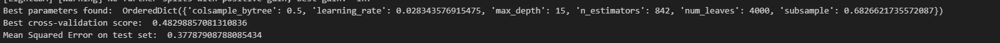

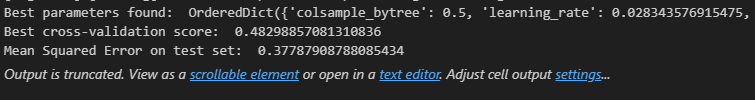

In [ ]:
param_space = {
    'model__min_data_in_leaf': (100,4000),
    'model__num_leaves': (20, 4000),             # Range for number of leaves
    'model__max_depth': (5, 15),               # Range for max depth
    'model__learning_rate': (0.01, 0.3, 'log-uniform'),  # Log-uniform distribution for learning rate
    'model__n_estimators': (1, 1000),        # Range for number of estimators
    'model__subsample': (0.5, 1.0, 'uniform'), # Uniform distribution for subsample
    'model__colsample_bytree': (0.5, 1.0, 'uniform')  # Uniform distribution for colsample_bytree
}
pipeline = Pipeline([
    ('poly', PolynomialFeatures(degree=2, interaction_only=True)),
    ('scaler', StandardScaler()),
    ('model', lgb.LGBMRegressor(objective='regression', random_state=42))
])
opt = BayesSearchCV(
    estimator=pipeline,
    search_spaces=param_space,
    n_iter=50,  # Increase number of iterations
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,
    random_state=42
)
opt.fit(X_train_8, y_train_8)
print("Best parameters found: ", opt.best_params_)
print("Best cross-validation score: ", opt.best_score_)

y_pred = opt.predict(X_test_8)

mse = mean_squared_error(y_test_8, y_pred)
print("Mean Squared Error on test set: ", mse)

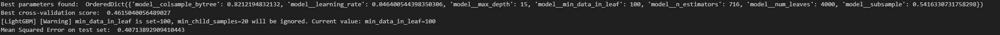

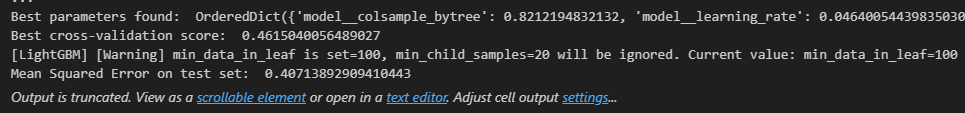

##### Question 8.3.

Qualitatively interpret the effect of the hyperparameters using the Bayesian opti- mization results: Which of them helps with performance? Which helps with reg- ularization (shrinks the generalization gap)? Which affects the fitting efficiency?

We implemented a standard bayasian optimization model using an LGBM Regressor as well as a pipeline that utilized Polynmial Features, Standard Scaler, and LGBM Regressor. Unfortunately the results for Bayesian optimization were not as successful as the standard model. This is most likely due to overfitting.

In terms of hyperparameters that affect performance, the learning rate is a balance between performance and execution time. The number of leaves and max depth control model complexity. Subsamples introduce randomness that can help with overfitting. Regularization adds constraints to the model which helps with overftting. Some examples of constraints that help with regularization include min_child_weight and subsample. Min_child_weight esures that the leaves have the minimum number of samples, reducing noise. Subsample randomly selects a fraction of training data for each tree which introduces diversity. Fitting efficiency involves the amount of compute resources used during training. Max_bin controls the discretization of continious features which can lead to faster computations.

# PART II: Show Us Your Skills: Twitter Data

An end-to-end ML pipeline to accomplish any particular goal: regression, classification, clustering or anything else.

In [ ]:
!pip install autoname
!pip install datasets

!pip install -qU \
  pinecone-client==3.1.0 \
  pinecone-datasets==0.7.0 \
  sentence-transformers==2.2.2

!pip install pydantic==1.10.11

In [ ]:
import datetime
import json
import numpy as np
import os
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import pytz
import random
import re
import time
import torch

from autoname import AutoName
from datasets import Dataset
from enum import auto
from tqdm import tqdm
from typing import Any, Dict, List, Optional, Union
from pinecone import Pinecone, ServerlessSpec
from pydantic import BaseModel, Field
import seaborn as sns
from sentence_transformers import SentenceTransformer
from sklearn.model_selection import train_test_split
from transformers.pipelines.pt_utils import KeyDataset
from typing_extensions import Annotated


random.seed(0)

### 3.4. About the Data

https://ucla.box.com/s/24oxnhsoj6kpxhl6gyvuck25i3s4426d

The data consists of 6 text files, each one containing tweet data from one hashtag as indicated in the filenames.

In [ ]:
data_dir = "data/"
data_dir = "drive/MyDrive/ECE219/project4/"

In [ ]:
!curl -L  https://ucla.box.com/shared/static/24oxnhsoj6kpxhl6gyvuck25i3s4426d --output ECE219_tweet_data.zip
!unzip ECE219_tweet_data.zip -d {data_dir}

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100    10    0    10    0     0      7      0 --:--:--  0:00:01 --:--:--    13
100 1278M  100 1278M    0     0  62.5M      0  0:00:20  0:00:20 --:--:-- 67.8M
Archive:  ECE219_tweet_data.zip
replace drive/MyDrive/ECE219/project4/tweets_#gohawks.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
tags = [re.search('tweets_#(.*).txt', f).group(1) for f in os.listdir(data_dir) if f.startswith("tweets")]
tags

['nfl', 'superbowl', 'sb49', 'patriots', 'gohawks', 'gopatriots']

## Utility Functions to Handle datetime Fields

In [ ]:
pst_tz = pytz.timezone('America/Los_Angeles')

def unix_to_datetime(unix_time, ms=False):
    unix_time_int = int(unix_time) / 1000 if ms else int(unix_time)
    return datetime.datetime.fromtimestamp(unix_time_int, pst_tz)

def convert_datetime_fields(line):
    line["firstpost_date"] = unix_to_datetime(line["firstpost_date"])
    if "timestamp_ms" in line["tweet"]:
        line["tweet"]["timestamp_ms"] = unix_to_datetime(line["tweet"]["timestamp_ms"], ms=True)
    line["metrics"]["peak"] = unix_to_datetime(line["metrics"]["peak"])
    citation_data = []
    for i, data in enumerate(line["metrics"]["citations"]["data"]):
        data["timestamp"] = unix_to_datetime(data["timestamp"])
        citation_data.append(data)
    line["metrics"]["citations"]["data"] = citation_data
    return line

## Typed Data Model

### Tweets Data
*Fields commented out are considered not necessary for our project angles.*

In [ ]:
from autoname import AutoName
from enum import auto
from typing import Any, Dict, List, Optional, Union
from pydantic import BaseModel, Field
from typing_extensions import Annotated


# class MediaSize(AutoName):
#     large = auto()
#     small = auto()
#     medium = auto()
#     thumb = auto()


# class SizeConfig(BaseModel):
#     h: int
#     resize: str
#     w: int


# class Media(BaseModel):
#     expanded_url: str
#     sizes: Dict[MediaSize, SizeConfig]
#     url: str
#     media_url_https: str
#     id_str: str
#     indices: List[int]
#     media_url: str
#     type: str
#     id: int
#     display_url: str


# class Url(BaseModel):
#     indices: List[int]
#     url: str
#     expanded_url: str
#     display_url: str


class Hashtag(BaseModel):
    text: str             # e.g. 'Seahawks' / 'Patriots' / 'SB49'
    # indices: List[int]


class UserMention(BaseModel):
    screen_name: str      # e.g. 'SuperBowl'  / 'PatriotsBeat'
    name: str             # e.g. 'Super Bowl' / 'PatriotsBeat_Podcast'

    # indices: List[int]  # e.g. [5, 15]      / [0, 13]
    # id_str: str         # e.g. '19425947'   / '557419680'
    # id: int             # e.g. 19425947     / 557419680


class Entity(BaseModel):
    hashtags: List[Hashtag]
    user_mentions: List[UserMention]

    # trends: List = []                    # hardly available
    # symbols: List = []                   # e.g. [{'indices': [0, 5], 'text': 'MINE'}]
    # media: Optional[List[Media]] = None
    # urls: List[Url]


class User(BaseModel):
    id: int                                      # e.g. 567774276
    id_str: str                                  # e.g. '567774276'
    ## geo_enabled: bool
    description: Optional[str] = None            # e.g. 'Juxtapositionist'
    ## verified: bool
    ## is_translator: bool
    followers_count: int                         # e.g. 495
    ## default_profile_image: bool
    location: str                                # e.g. 'Wisconsin, USA'
    utc_offset: Optional[int] = None             # e.g. -21600
    ## statuses_count: int                          # e.g. 1080
    friends_count: int                           # e.g. 29
    name: str                                    # e.g. '..Everyone Goes Nuts'
    lang: str                                    # e.g. 'en'
    favourites_count: int                        # e.g. 95
    screen_name: str                             # e.g. 'oakcreektv'
    ## created_at: str                              # e.g. 'Tue May 01 00:28:40 +0000 2012'
    ## contributors_enabled: bool
    time_zone: Optional[str] = None              # e.g. 'Central Time (US & Canada)'
    ## protected: bool
    ## default_profile: bool
    listed_count: Optional[int] = None           # e.g. 4

    # follow_request_sent: Optional[Any] = None  # hardly available
    # notifications: Optional[Any] = None        # hardly available
    # following: Optional[Any] = None            # hardly available
    # profile_use_background_image: bool
    # profile_sidebar_fill_color: str
    # profile_text_color: str
    # profile_sidebar_border_color: str
    # profile_background_color: str
    # profile_link_color: str
    # profile_background_tile: bool
    # profile_image_url_https: str
    # profile_image_url: str
    # profile_background_image_url_https: str
    # profile_banner_url: Optional[str] = None
    # profile_background_image_url: str
    # url: Optional[str] = None


class PlaceType(AutoName):
    Admin = 'admin'
    City = 'city'
    Neighborhood = 'neighborhood'
    Country = 'country'


# class BoundingBox(BaseModel):
#     type: str                             # e.g. 'Polygon'
#     coordinates: List[List[List[float]]]  # e.g. [[[-114.818269, 31.3322463], [-114.818269, 37.004261], [-109.045152, 37.004261], [-109.045152, 31.3322463]]]


class Place(BaseModel):
    full_name: str                                 # e.g. 'Arizona, USA'     / 'Boston Medical Library'
    country: str                                   # e.g. 'United States'    / 'United States'
    place_type: Union[PlaceType, Any]              # e.g. 'admin'            / 'poi' -- only few examples where place type isn't in PlaceType enums
    ## bounding_box: Optional[BoundingBox] = None
    country_code: str                              # e.g. 'US'               / 'US'
    ## attributes: Dict                            # e.g. {}                 / {'street_address': '10 Shattuck St Ste 3'}
    ## id: str                                     # e.g. 'a612c69b44b2e5da' / '430931f600000000'
    name: str                                      # e.g. 'Arizona'          / 'Boston Medical Library'

    # url: str                                     # e.g. 'https://api.twitter.com/1.1/geo/id/a612c69b44b2e5da.json' / 'https://api.twitter.com/1.1/geo/id/430931f600000000.json'


## class Coordinates(BaseModel):
##     type: str                 # e.g. mostly 'Point'
##     coordinates: List[float]  # e.g. [-92.28661, 34.745601]


class FilterLevel(AutoName):
    Low = 'low'
    Medium = 'medium'


class Tweet(BaseModel):
    ## truncated: bool
    id: int                                                     # e.g. 564135255897288704
    id_str: str                                                 # e.g. '564135255897288704'
    favorited: bool
    favorite_count: int
    retweeted: bool
    retweet_count: int
    ## coordinates: Optional[Coordinates] = None
    timestamp_ms: Optional[datetime.datetime] = None              # e.g. 1421238675690
    entities: Entity
    user: User
    ## geo: Optional[Coordinates] = None
    ## possibly_sensitive: bool
    lang: str                                                     # e.g. 'en'
    created_at: str                                               # e.g. 'Sat Feb 07 18:55:00 +0000 2015'
    ## filter_level: FilterLevel                                     # e.g. 'low'
    place: Optional[Place] = None

    # text: str                                                   # same as TweetData.title, e.g. '@PatriotsBeat Incredible fan\'s eye view of #SB49 "#Patriots Beat the #Seahawks.Everyone Goes Nuts." https://t.co/dtIfDEkZlJ #PatriotsNation'
    # contributors: Optional[Any] = None                          # hardly available
    # source: str                                                 # e.g. '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'
    # in_reply_to_status_id: Optional[Any] = None                 # e.g. 555175019873964032
    # in_reply_to_status_id_str: Optional[Any] = None             # e.g. '555175019873964032'
    # in_reply_to_screen_name: Optional[Any] = None               # e.g. 'jbott32'
    # in_reply_to_user_id: Optional[Any] = None                   # e.g. 82452420
    # in_reply_to_user_id_str: Optional[Any] = None               # e.g. '82452420'
    # scopes: Optional[Dict] = None                               # e.g. {'place_ids': ['96683cc9126741d1']}, {'followers': False}
    # extended_entities: Optional[Dict[str, List[Media]]] = None


class Author(BaseModel):
    followers: float                         # e.g. 85.0
    influence_level: Optional[float] = None  # e.g. 1.0
    description: Optional[str] = None        # e.g. 'I make rap music for the people. E-mail me beats at AkeOTNB@gmail.com'

    # type: str                              # e.g. mostly 'twitter'
    # author_img: str                        # e.g. 'http://pbs.twimg.com/profile_images/557755745547337728/3VEBAvty_normal.jpeg'
    # name: str                              # e.g. 'AWz216'
    # url: str                               # e.g. 'http://twitter.com/216awz'
    # nick: str                              # e.g. '216awz'
    # image_url: str                         # e.g. 'http://pbs.twimg.com/profile_images/557755745547337728/3VEBAvty_normal.jpeg'


class CitationData(BaseModel):
    timestamp: datetime.datetime  # e.g. 1423328399
    citations: int                # e.g. 0


class Citation(BaseModel):
    influential: int          # e.g. 0 / 55
    total: int                # e.g. 1
    data: List[CitationData]
    matching: int             # e.g. 1
    replies: int              # e.g. 0


class Metrics(BaseModel):
    acceleration: Annotated[int, Field(gte=-100, lte=100)]
    ranking_score: float                                    # e.g. 3.8630066
    citations: Citation
    peak: datetime.datetime                                          # e.g. 0 / 1423195199
    impressions: int                                        # e.g. 34
    momentum: int                                           # e.g. 0 / 8 /  82


class TweetType(AutoName):
    Tweet = "tweet"
    RetweetReply = "retweet:reply"
    RetweetNative = "retweet:native"


class TweetData(BaseModel):
    firstpost_date: datetime.datetime
    title: str
    tweet: Tweet
    author: Author
    original_author: Author
    citation_date: datetime.datetime
    metrics: Metrics
    highlight: str
    type: TweetType

    # url: str
    # citation_url: str

### Score Data

*Scoring Summary from https://www.espn.co.uk/nfl/playbyplay/_/gameId/400749027*

In [ ]:
# scoring data

class ScoreType(AutoName):
    TouchDown = auto()
    FieldGoal = auto()


class Team(AutoName):
    Patriots = auto()
    Seahawks = auto()


class Player(AutoName):
    LaFell = "Brandon LaFell"
    Brady = "Tom Brady"
    Gostkowski = "Stephen Gostkowski"
    Lynch = "Marshawn Lynch"
    Hauschka = "Steven Hauschka"
    Gronkowski = "Rob Gronkowski"
    Matthews = "Chris Matthews"
    Wilson = "Russell Wilson"
    Baldwin = "Doug Baldwin"
    Amendola = "Danny Amendola"
    Edelman = "Julian Edelman"


class Scoring(BaseModel, use_enum_values=True):
    type: ScoreType
    time_remaining: datetime.timedelta
    team: Team
    quarter: Annotated[int, Field(gte=1, lte=4)]
    yard: Annotated[int, Field(gt=0)]
    score: int
    score_by: Player
    pass_from: Optional[Player] = None
    kicker: Optional[Player] = None

## Data Processing

### **One-off** Subset Selection per Hashtag and Typing

*Load raw tweets data for each hashtag and randomly select a subset of each file (20%) because file sizes are too big to run in Colab. Selected lines are converted into typed `TweetData` that contains potentially userful data points for the project. The output list of `TweetData` will then be cached as pickle files.*

In [ ]:
subset = 0.2
line_limit = 200000

for tag in tags:
    filename = f'tweets_#{tag}.txt'

    print(f"\nLoading data for #{tag}...")
    with open(data_dir + filename, 'r') as f:
        lines = f.readlines()
        lines = random.choices(lines, k=round(len(lines) * subset))
        num_batch = len(lines) // line_limit + 1
        print(f"\tSelecting {len(lines)} tweets data ({subset * 100}%).")

    for batch in range(num_batch):
        batch_name = f'subset_tweets_#{tag}_{batch}'

        if batch_name not in os.listdir(data_dir):
            start_line = batch * line_limit
            end_line = (batch + 1) * line_limit
            print(f"\n\tLoading {batch + 1} / {num_batch} batch...")
            tag_tweets_data = []
            for i, line in enumerate(tqdm(lines[start_line : end_line])):
                line = json.loads(line)
                line = convert_datetime_fields(line)
                tweet = TweetData(**line)
                tag_tweets_data.append(tweet)

            with open(data_dir + f'subset_tweets_#{tag}_{batch}', 'wb') as fp:
                pickle.dump(tag_tweets_data, fp)

            del tag_tweets_data
    del lines


Loading data for #gohawks...
	Selecting 33824 tweets data (20.0%).

	Loading 1 / 1 batch...


100%|██████████| 33824/33824 [00:12<00:00, 2610.08it/s]



Loading data for #gopatriots...
	Selecting 4702 tweets data (20.0%).

	Loading 1 / 1 batch...


100%|██████████| 4702/4702 [00:01<00:00, 2637.18it/s]



Loading data for #nfl...
	Selecting 46604 tweets data (20.0%).

	Loading 1 / 1 batch...


100%|██████████| 46604/46604 [00:23<00:00, 2022.87it/s]



Loading data for #patriots...
	Selecting 88124 tweets data (20.0%).

	Loading 1 / 1 batch...


100%|██████████| 88124/88124 [00:35<00:00, 2489.96it/s]



Loading data for #sb49...
	Selecting 148730 tweets data (20.0%).

	Loading 1 / 1 batch...


100%|██████████| 148730/148730 [01:01<00:00, 2400.02it/s]



Loading data for #superbowl...
	Selecting 242763 tweets data (20.0%).

	Loading 1 / 2 batch...


100%|██████████| 200000/200000 [01:41<00:00, 1964.23it/s]



	Loading 2 / 2 batch...


100%|██████████| 42763/42763 [00:16<00:00, 2619.42it/s]


### **One-off** Get Unique Tweet Texts from Subset TweetsData across Hashtags

*Once the above processing is done, we can read the cached `TweetData` and tweet ID, tweet contents, and any other data needed. We will first filter the unique tweets by tweet IDs, which will be used to create train (80%) and test (20%) datasets.*

In [ ]:
cached_files = [f for f in os.listdir(data_dir) if f.startswith("typed_tweets_unique")]
has_cached_typed_data = len(cached_files) > 0

tweets = []
tweets_ids = []
tweets_data = []
filenames = [f for f in os.listdir(data_dir) if f.startswith("subset_tweets")]
for filename in filenames:
    print(f"\nLoading {filename}...")
    with open (data_dir + filename, 'rb') as fp:
        typed_data = pickle.load(fp)
        if not has_cached_typed_data:
            tweets_data.extend(typed_data)
        for tweet in tqdm(typed_data):
            tweets.append(tweet.title)
            tweets_ids.append(tweet.tweet.id_str)

print('\n'.join(tweets[:5]))
print(f"\n{len(tweets)} tweets in total.")

unique_tweets_ids, unique_tweet_idx = np.unique(tweets_ids, return_index=True)
unique_tweets = list(np.array(tweets)[unique_tweet_idx])
print(f"\nThere are {len(unique_tweets)} unique tweets.")

del tweets_ids
del tweets


Loading subset_tweets_#gohawks_0...


100%|██████████| 33824/33824 [00:00<00:00, 549305.91it/s]



Loading subset_tweets_#gopatriots_0...


100%|██████████| 4702/4702 [00:00<00:00, 437898.12it/s]



Loading subset_tweets_#nfl_0...


100%|██████████| 46604/46604 [00:00<00:00, 525024.49it/s]



Loading subset_tweets_#patriots_0...


100%|██████████| 88124/88124 [00:00<00:00, 555928.16it/s]



Loading subset_tweets_#sb49_0...


100%|██████████| 148730/148730 [00:00<00:00, 183824.48it/s]



Loading subset_tweets_#superbowl_0...


100%|██████████| 200000/200000 [00:01<00:00, 150494.60it/s]



Loading subset_tweets_#superbowl_1...


100%|██████████| 42763/42763 [00:00<00:00, 518185.27it/s]


Back to football! #SB49 #gohawks
Back in stock! #Seattle #Seahawks #Fabric both in flat and fleece!  #GoHawks #Twelfie #12thMan http://t.co/1NDbZmgTqk
#GOHAWKS ! http://t.co/HBHcLW8WTG
Greeting! Met 2 SeaFans @YosemiteNPS @DangeRussWilson@Seahawks@komonews #GoHawks #repete #lob #SB49 #SuperBowlXLIX http://t.co/H2Y3hiQSe8
Deflate the balls and get bullshit calls...#GOHAWKS

564747 tweets in total.

There are 495581 unique tweets.


### Get Train and Test Tweets

In [ ]:
cached_files = [f for f in os.listdir(data_dir) if f.startswith("train_tweets")]
has_cached_typed_data = len(cached_files) > 0

if has_cached_typed_data:
    # To read cached train and test text data
    with open (data_dir + 'train_tweets', 'rb') as fp:
        tweets_train = pickle.load(fp)
    with open (data_dir + 'test_tweets', 'rb') as fp:
        tweets_test = pickle.load(fp)
    with open (data_dir + 'train_tweets_ids', 'rb') as fp:
        tweets_ids_train = pickle.load(fp)
    with open (data_dir + 'test_tweets_ids', 'rb') as fp:
        tweets_ids_test = pickle.load(fp)
else:
    tweets_train, tweets_test, tweets_ids_train, tweets_ids_test = train_test_split(
        unique_tweets, unique_tweets_ids, test_size=0.2, random_state=0
    )
    # To cache train and test text data
    with open(data_dir + 'train_tweets', 'wb') as fp:
        pickle.dump(tweets_train, fp)
    with open(data_dir + 'test_tweets', 'wb') as fp:
        pickle.dump(tweets_test, fp)
    with open(data_dir + 'train_tweets_ids', 'wb') as fp:
        pickle.dump(tweets_ids_train, fp)
    with open(data_dir + 'test_tweets_ids', 'wb') as fp:
        pickle.dump(tweets_ids_test, fp)

print(f'Number of training tweets: {len(tweets_train)}')
print(f'Number of testing tweets: {len(tweets_test)}')

Number of training tweets: 396589
Number of testing tweets: 99148


### Get All Unique TweetsData

In [ ]:
cached_files = [f for f in os.listdir(data_dir) if f.startswith("typed_tweets_unique")]
has_cached_typed_data = len(cached_files) > 0

if has_cached_typed_data:
    unique_tweets_data = {}
    for i, f in enumerate(cached_files):
        print(f"\nLoading {i + 1} / {len(cached_files)} batch of unique typed data...")
        with open (data_dir + f, 'rb') as fp:
            unique_tweets_batch = pickle.load(fp)
            unique_tweets_data.update(unique_tweets_batch)

            del unique_tweets_batch
else:
    num_batches = len(unique_tweets_ids) // line_limit + 1
    unique_tweets_data = {}
    for t in tweets_data:
        if t.tweet.id_str not in unique_tweets_data:
          unique_tweets_data[t.tweet.id_str] = t

    for batch in range(num_batches):
        print(f"\nCaching {batch + 1} / {num_batches} batch of unique typed data...")
        batch_ids = unique_tweets_ids[batch * line_limit: (batch + 1) * line_limit]
        unique_tweets_batch = {}
        for id in batch_ids:
            unique_tweets_batch[id] = unique_tweets_data[id]
        with open(data_dir + f'typed_tweets_unique_{batch}', 'wb') as fp:
            pickle.dump(unique_tweets_batch, fp)

        del unique_tweets_batch

print(f'Total number of TweetsData: {len(unique_tweets_data)}')
display(list(unique_tweets_data.keys())[:5])


Loading 1 / 3 batch of unique typed data...

Loading 2 / 3 batch of unique typed data...

Loading 3 / 3 batch of unique typed data...
Total number of TweetsData: 495737


['549658771749101568',
 '550144662250729472',
 '550731012586479616',
 '550849637176057857',
 '551137135038705664']

### Get All TweetData during the Match

In [ ]:
start_time = datetime.datetime(2015, 2, 1, 15, 0, tzinfo=pst_tz)
end_time = datetime.datetime(2015, 2, 1, 20, 0, tzinfo=pst_tz)

tweets_on_date = {}
for id, data in unique_tweets_data.items():
    data.citation_date = data.citation_date.replace(tzinfo=pst_tz)
    if data.citation_date >= start_time and data.citation_date <= end_time:
        tweets_on_date[id] = data

print(f"{len(tweets_on_date)} tweets during the game from the 20% subsample.")

sorted_list = sorted([t.citation_date for t in tweets_on_date.values()])
display(sorted_list[0])
display(sorted_list[-1])

40972 tweets during the game from the 20% subsample.


datetime.datetime(2015, 2, 1, 15, 0, tzinfo=<DstTzInfo 'America/Los_Angeles' LMT-1 day, 16:07:00 STD>)

datetime.datetime(2015, 2, 1, 20, 0, tzinfo=<DstTzInfo 'America/Los_Angeles' LMT-1 day, 16:07:00 STD>)

### Create DataFrame for Score Data

In [ ]:
scores = [
    Scoring(
        quarter=2,
        time_remaining=datetime.timedelta(minutes=9, seconds=47),
        type=ScoreType.TouchDown,
        team=Team.Patriots,
        yard=11,
        score=7,
        score_by=Player.LaFell,
        pass_from=Player.Brady,
        kicker=Player.Gostkowski,
    ),
    Scoring(
        quarter=2,
        time_remaining=datetime.timedelta(minutes=2, seconds=16),
        type=ScoreType.TouchDown,
        team=Team.Seahawks,
        yard=3,
        score=7,
        score_by=Player.Lynch,
        pass_from=None,
        kicker=Player.Hauschka,
    ),
    Scoring(
        quarter=2,
        time_remaining=datetime.timedelta(minutes=0, seconds=31),
        type=ScoreType.TouchDown,
        team=Team.Patriots,
        yard=22,
        score=7,
        score_by=Player.Gronkowski,
        pass_from=Player.Brady,
        kicker=Player.Gostkowski,
    ),
    Scoring(
        quarter=2,
        time_remaining=datetime.timedelta(minutes=0, seconds=2),
        type=ScoreType.TouchDown,
        team=Team.Seahawks,
        yard=11,
        score=7,
        score_by=Player.Matthews,
        pass_from=Player.Wilson,
        kicker=Player.Hauschka,
    ),
    Scoring(
        quarter=3,
        time_remaining=datetime.timedelta(minutes=11, seconds=9),
        type=ScoreType.FieldGoal,
        team=Team.Seahawks,
        yard=27,
        score=3,
        score_by=Player.Hauschka,
        pass_from=None,
        kicker=None,
    ),
    Scoring(
        quarter=3,
        time_remaining=datetime.timedelta(minutes=4, seconds=54),
        type=ScoreType.TouchDown,
        team=Team.Seahawks,
        yard=3,
        score=7,
        score_by=Player.Baldwin,
        pass_from=Player.Wilson,
        kicker=Player.Hauschka,
    ),
    Scoring(
        quarter=4,
        time_remaining=datetime.timedelta(minutes=7, seconds=55),
        type=ScoreType.TouchDown,
        team=Team.Patriots,
        yard=4,
        score=7,
        score_by=Player.Amendola,
        pass_from=Player.Brady,
        kicker=Player.Gostkowski,
    ),
    Scoring(
        quarter=2,
        time_remaining=datetime.timedelta(minutes=2, seconds=2),
        type=ScoreType.TouchDown,
        team=Team.Patriots,
        yard=3,
        score=7,
        score_by=Player.Edelman,
        pass_from=Player.Brady,
        kicker=Player.Gostkowski,
    ),
]

scores_df = pd.DataFrame([dict(s) for s in scores])
scores_df = scores_df.sort_values(['quarter', 'time_remaining'], ascending=[True, False])
scores_df.head(3)

,type,time_remaining,team,quarter,yard,score,score_by,pass_from,kicker
0,TouchDown,0 days 00:09:47,Patriots,2,11,7,Brandon LaFell,Tom Brady,Stephen Gostkowski
1,TouchDown,0 days 00:02:16,Seahawks,2,3,7,Marshawn Lynch,None,Steven Hauschka
7,TouchDown,0 days 00:02:02,Patriots,2,3,7,Julian Edelman,Tom Brady,Stephen Gostkowski


### Question 9.

##### Question 9.1.

Report the following statistics for each hashtag, i.e. each file has:
* Average number of tweets per hour
* Average number of followers of users posting the tweets per tweet (to make it simple, we average over the number of tweets; if a users posted twice, we count the user and the user’s followers twice as well)
* Average number of retweets per tweet

In [ ]:
tweets_data = {}
num_tweets_per_hour = {}
for tag in tags:
    print(f"\nTweets data for #{tag}:")
    posting_times = []
    num_retweets = []
    num_followers = []
    with open(f'{data_dir}tweets_#{tag}.txt', 'r') as file:
        for i, line in enumerate(file.readlines()):
            if i % 100000 == 0:
                print(i)
            tweet = json.loads(line)
            posting_times.append(unix_to_datetime(tweet["citation_date"]))
            num_followers.append(tweet["author"]["followers"])
            num_retweets.append(tweet["metrics"]["citations"]["total"])

    posting_times = pd.Series(posting_times)
    postings_per_hour = posting_times.groupby([posting_times.dt.date, posting_times.dt.hour]).count()
    num_tweets_per_hour[tag] = postings_per_hour

    avg_postings_per_hour = postings_per_hour.mean()
    avg_num_followers = np.mean(num_followers)
    avg_num_retweets = np.mean(num_retweets)
    print(f"\tAverage postings per hour: {avg_postings_per_hour}")
    print(f"\tAverage number of followers per author: {avg_num_followers}")
    print(f"\tAverage number of retweets per tweet: {avg_num_retweets}")


Tweets data for #gohawks:
0
100000
	Average postings per hour: 296.70526315789476
	Average number of followers per author: 2217.9237355281984
	Average number of retweets per tweet: 2.0132093991319877

Tweets data for #gopatriots:
0
	Average postings per hour: 53.31292517006803
	Average number of followers per author: 1427.2526051635405
	Average number of retweets per tweet: 1.4081919101697078

Tweets data for #nfl:
0
100000
200000
	Average postings per hour: 399.69468267581476
	Average number of followers per author: 4662.37544523693
	Average number of retweets per tweet: 1.5344602655543254

Tweets data for #patriots:
0
100000
200000
300000
400000
	Average postings per hour: 750.6320272572402
	Average number of followers per author: 3280.4635616550277
	Average number of retweets per tweet: 1.7852871288476946

Tweets data for #sb49:
0
100000
200000
300000
400000
500000
600000
700000
	Average postings per hour: 1384.8212290502793
	Average number of followers per author: 10374.1602920194

##### Question 9.2.

Plot “number of tweets in hour” over time for `#SuperBowl` and `#NFL` (a bar plot with 1-hour bins). The tweets are stored in separate files for different hashtags and files are named as `tweet_[#hashtag].txt`.

**Note**: The tweet file contains one tweet in each line and tweets are sorted with respect to their posting time. Each tweet is a JSON [1] string that you can load in Python as a dictio- nary. For example, if you parse it to object json_object = json.loads(json_string) , you can look up the time a tweet is posted by:

`json_object['citation_date']`

You may also assess the number of retweets of a tweet through the following command:

`json_object['metrics']['citations']['total']`

Besides, the number of followers of the person tweeting can be retrieved via:

`json_object['author']['followers']`

The time information in the data file is in the form of UNIX time, which “encodes a point in time as a scalar real number which represents the number of seconds that have passed since the beginning of 00:00:00 UTC Thursday, 1 January 1970” (see Wikipedia [2] for details). In Python, you can convert it to human-readable date by

```
import datetime
datetime_object = datetime.datetime.fromtimestamp(unix_time)
```

The conversion above gives out a datetime object storing the date and time in your local time zone corresponding to that UNIX time.



In later parts of the project, you may need to use the PST time zone to interpret the UNIX timestamps. To specify the time zone you would like to use, refer to the example below:

```
import pytz
pst_tz = pytz.timezone('America/Los_Angeles')
datetime_object_in_pst_timezone =
,→ datetime.datetime.fromtimestamp(unix_time, pst_tz)
```

For more details about datetime operation and time zones, see
https://medium.com/@eleroy/10-things-you-need-to-know-about-date-and-time-in-pythoon


[1] https://www.json.org/

[2] https://en.wikipedia.org/wiki/Unix_time

superbowl


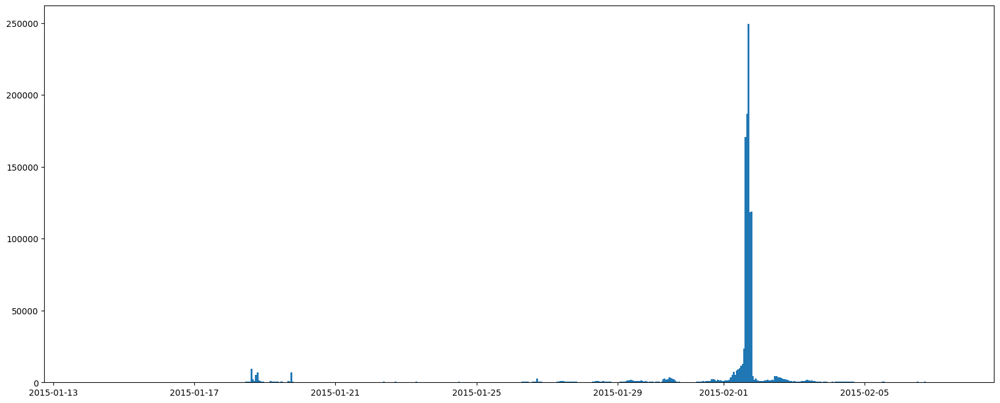

nfl


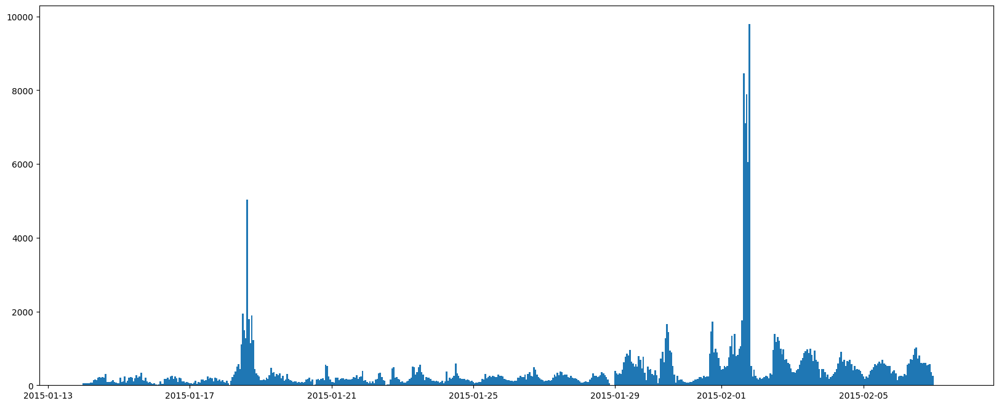

In [ ]:
plt.rcParams["figure.figsize"] = (20,8)

for tag in ["superbowl", "nfl"]:
    print(tag)
    hourly_tweets = num_tweets_per_hour[tag]
    x_axis = [datetime.datetime(t[0].year, t[0].month, t[0].day, t[1]) for t in hourly_tweets.index]
    bar_chart = plt.bar(x_axis, hourly_tweets.values, width=0.05)
    plt.show()

### Question 10.

Follow the steps outlined below:
* Describe your task.
* Explore the data and any metadata (you can even incorporate additional datasets if you choose).
* Describe the feature engineering process. Implement it with reason: Why are you extracting features this way - why not in any other way?
* Generate baselines for your final ML model.
* A thorough evaluation is necessary.
* Be creative in your task design - use things you have learned in other classes too if you are excited about them!



#### Topics covered

1) Given a player scoring (e.g. Tom Brady), predict the time when the event happened based on the traffic

2) Based on the sentiments on each of the players after the kick-off time, predict the MVP - an approach similar to comparing the sentiments during the time when traffic is high

3) Fan group predict based on hashtags, texts, user description etc

4) Average sentiment per player over time + critical events derived from the twitter contents

5.) Asses the matching probability percentage for a query that reflects the main topics of the tweets (players, ect.)



## Application of Pinecone
https://www.pinecone.io/

*initializing our connection to Pinecone.*

In [ ]:
# configure client
pc = Pinecone(api_key="b541d5e1-bd3b-4d6f-ade3-b33ab9f9835a")
spec = ServerlessSpec(cloud='aws', region='us-east-1')

pc.list_indexes()

{'indexes': [{'dimension': 384,
              'host': 'sentiment-mining-8ego60a.svc.aped-4627-b74a.pinecone.io',
              'metric': 'cosine',
              'name': 'sentiment-mining',
              'spec': {'serverless': {'cloud': 'aws', 'region': 'us-east-1'}},
              'status': {'ready': True, 'state': 'Ready'}}]}

*A retriever model is used to embed passages and queries, and it creates embeddings such that queries and passages with similar meanings are close in the vector space. We will use a sentence-transformer model as our retriever using MiniLM-L6 sentence transformer model. This is a very efficient semantic similarity embedding model from the sentence-transformers library.*

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
if device != 'cuda':
    print(f"You are using {device}. This is much slower than using "
          "a CUDA-enabled GPU. If on Colab you can change this by "
          "clicking Runtime > Change runtime type > GPU.")

retriever = SentenceTransformer('all-MiniLM-L6-v2', device=device)
retriever

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


.gitattributes:   0%|          | 0.00/1.23k [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

data_config.json:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

model.onnx:   0%|          | 0.00/90.4M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

train_script.py:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

SentenceTransformer(
  (0): Transformer({'max_seq_length': 256, 'do_lower_case': False}) with Transformer model: BertModel 
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False})
  (2): Normalize()
)

* *`max_seq_length` is `256`. That means that the maximum number of tokens (like words) that can be encoded into a single vector embedding is `256`. Anything beyond this *must* be truncated.*

* *`word_embedding_dimension` is `384`. This number is the dimensionality of vectors output by this model. It is important that we know this number later when initializing our Pinecone vector index.*

* *`Normalize()`. This final normalization step indicates that all vectors produced by the model are normalized. That means that models that we would typical measure similarity for using *cosine similarity* can also make use of the *dotproduct* similarity metric. In fact, with normalized vectors *cosine* and *dotproduct* are equivalent.*

### Utility functions

In [ ]:
def create_embeddings(
    index,
    retriever,
    tweets,
    batch_size,
    index_name,
    text_ids=None,
    sentiment_model=None,
    vector_limit=None
):
    if vector_limit is not None:
        sample_idx = random.sample(range(len(tweets)), vector_limit)
        tweets = list(np.array(tweets)[sample_idx])
        if text_ids is not None:
            text_ids = list(np.array(text_ids)[sample_idx])

    for i in tqdm(range(0, len(tweets), batch_size)):
        # find end of batch
        i_end = min(i+batch_size, len(tweets))
        batch = tweets[i:i_end]

        if isinstance(batch[0], TweetData):
            texts = [data.title for data in batch]
            ids = [data.tweet.id_str for data in batch]
            timestamps = [data.citation_date for data in batch]
        else:
            texts = batch
            ids = text_ids[i:i_end]

        # create metadata batch
        if index_name == "sentiment-mining":
            if sentiment_model is None:
                raise AttributeError("Sentiment model should be provided.")
            # get sentiment label and score for reviews in the batch
            labels, scores = get_sentiment(texts, sentiment_model)
            metadatas = [
                {'text': text, 'timestamp': timestamp, 'label': label, 'score': score}
                for text, label, score, timestamp
                in zip(texts, labels, scores, timestamps)
            ]
        else:
            metadatas = [{'text': text} for text in texts]
        # create embeddings
        emb = retriever.encode(texts)
        # create records list for upsert
        records = zip(ids, emb, metadatas)
        # upsert to Pinecone
        index.upsert(vectors=records)
    return index

### Dynamic Semantic Search Engine

*We have ~500k data but use the vector limit of 200k to generate embeddings within the rate limit with reasonable efficiency.*



#### Initialize Pinecone Index

*The Pinecone index stores vector representations of our passages which we can retrieve using another vector (the query vector). *we need to align the index `dimension` and `metric` parameters with those required by the `MiniLM-L6` model.*

In [ ]:
index_name = 'semantic-search'

# check if index already exists (it shouldn't if this is first time)
if index_name not in pc.list_indexes().names():
    # if does not exist, create index
    pc.create_index(
        index_name,
        dimension=retriever.get_sentence_embedding_dimension(),
        metric='cosine',
        spec=spec
    )
    # wait for index to be initialized
    while not pc.describe_index(index_name).status['ready']:
        time.sleep(1)

# connect to index
index_search = pc.Index(index_name)
# view index stats
index_search.describe_index_stats()

{'dimension': 384,
 'index_fullness': 0.0,
 'namespaces': {},
 'total_vector_count': 0}

#### Generate Embeddings and Upsert

*Upsert the data in batches.*

In [ ]:
vector_limit = 200000

tweets_data = [*tweets_train, *tweets_test]
tweets_ids = [*tweets_ids_train, *tweets_ids_test]

index_search = create_embeddings(
    index_search,
    retriever,
    tweets_data,
    512,
    index_name,
    text_ids=tweets_ids,
    vector_limit=vector_limit,
)
# check number of records in the index
index_search.describe_index_stats()

100%|██████████| 391/391 [13:57<00:00,  2.14s/it]


{'dimension': 384,
 'index_fullness': 0.0,
 'namespaces': {'': {'vector_count': 200000}},
 'total_vector_count': 200000}

#### Making Queries

*Make a semantic search for similar questions, so we should embed and search with another question.*

In [ ]:
query = "supporting patriots"

# create the query vector
xq = retriever.encode(query).tolist()

# now query
xc = index_search.query(vector=xq, top_k=5, include_metadata=True)
xc

{'matches': [{'id': '561959883118239744',
              'metadata': {'text': 'A Patriot supporting the Patriots. '
                                   '#patriots #superbowl #gopats '
                                   'http://t.co/BBl1bLi9Jq'},
              'score': 0.784667075,
              'values': []},
             {'id': '562041837204951040',
              'metadata': {'text': 'Cheering for the #patriots'},
              'score': 0.756920099,
              'values': []},
             {'id': '562028056156835842',
              'metadata': {'text': 'Supporting New England, from England! Go '
                                   'Pats! #NFL #SuperBowl #SuperBowlXLIX'},
              'score': 0.75300771,
              'values': []},
             {'id': '562030425103937536',
              'metadata': {'text': "I'm supporting #Patriots guys.... Who's "
                                   'with me? ð\x9f\x8f\x88'},
              'score': 0.742685139,
              'values': []},
          

In [ ]:
query = "well done Brady"

# create the query vector
xq = retriever.encode(query).tolist()

# now query
xc = index_search.query(vector=xq, top_k=5, include_metadata=True)
xc

{'matches': [{'id': '562075066125410304',
              'metadata': {'text': 'Good Shit Brady !!!! 🏈🏈🏈🏈🏈🏈 #Patriots'},
              'score': 0.747903407,
              'values': []},
             {'id': '562093846772064256',
              'metadata': {'text': 'Congrats Brady. #Superbowl #Patriots #NFL '
                                   'http://t.co/JcezzLcJvK'},
              'score': 0.746582031,
              'values': []},
             {'id': '562036150068473856',
              'metadata': {'text': 'Dang it Brady! #SuperBowl'},
              'score': 0.737654924,
              'values': []},
             {'id': '562082059767001088',
              'metadata': {'text': 'Good Job Brady. No close em out Patties '
                                   '#SuperBowl'},
              'score': 0.734539,
              'values': []},
             {'id': '562089070697136128',
              'metadata': {'text': 'well done Patriots #SuperBowl'},
              'score': 0.726229,
              'valu

*In the returned response `xc` we can see the most relevant questions to our particular query — we don't have any exact matches but we can see that the returned questions are similar in the topics they are asking about.*

In [ ]:
for result in xc['matches']:
    print(f"{round(result['score'], 2)}: {result['metadata']['text']}")

0.75: Good Shit Brady !!!! 🏈🏈🏈🏈🏈🏈 #Patriots
0.75: Congrats Brady. #Superbowl #Patriots #NFL http://t.co/JcezzLcJvK
0.74: Dang it Brady! #SuperBowl
0.73: Good Job Brady. No close em out Patties #SuperBowl
0.73: well done Patriots #SuperBowl


#### Delete Index

In [ ]:
# pc.delete_index(index_name)

*This dynamic search engine with semantic model behind appears to give back fairly accurate results that would have been expected by searching with a sentence or few words as query. Semantic words such as "support" or "well done" together with keywords "patriots" or "Brady" are correctly reflected in the result in the order of highest relevance.*

### Sentiment Mining - Predicting MVP

*We have ~40k tweets around the time of the match out of the ~500k data that was initially sub-sampled (random, 20%).*

*We will use a RoBERTa model fine-tuned for sentiment analysis to analyze the tweets. The model can be loaded from the HuggingFace model hub as follows:*

In [ ]:
from transformers import (
    pipeline,
    AutoTokenizer,
    AutoModelForSequenceClassification
    )

model_id = "cardiffnlp/twitter-roberta-base-sentiment"

# load the model from huggingface
model = AutoModelForSequenceClassification.from_pretrained(
    model_id,
    num_labels=3
)

# load the tokenizer from huggingface
tokenizer = AutoTokenizer.from_pretrained(model_id)

# load the tokenizer and model into a sentiment analysis pipeline
nlp = pipeline(
    "sentiment-analysis",
    model=model,
    tokenizer=tokenizer,
    device=device
    )


config.json:   0%|          | 0.00/747 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

#### Utility functions


*The sentiment analysis model returns LABEL_0 for negative, LABEL_1 for neutral and LABEL_2 for positive labels. We can add them to a dictionary to easily access them when showing the results.*

In [ ]:
labels = {
    "LABEL_0": "negative",
    "LABEL_1": "neutral",
    "LABEL_2": "positive"
}


def get_sentiment(tweets, model):
    dataset = Dataset.from_dict({"tweets": tweets})
    # pass the reviews through sentiment analysis pipeline
    sentiments = model(KeyDataset(dataset, "tweets"))
    # extract only the label and score from the result
    l = [labels[x["label"]] for x in sentiments]
    s = [x["score"] for x in sentiments]
    return l, s


def count_sentiment(result):
    # store count of sentiment labels
    sentiments = {
        "negative": 0,
        "neutral": 0,
        "positive": 0,
    }
    # iterate through search results
    for r in result:
        # extract the sentiment label and increase its count
        sentiments[r["metadata"]["label"]] += 1
    return sentiments


def contains_name(column_series, name):
    name = name.lower().split(" ")
    name_in_text = column_series.apply(
        lambda x: name[0] in x.lower() or name[-1] in x.lower()
    )
    return name_in_text


def get_data_per_player(result, raw_data, suffix = None):
    player_data_raw = {}
    for r in result:
        tweet_data = raw_data[r["id"]]
        player_data_raw[r["id"]] = {
            "text": tweet_data.title,
            "timestamp": tweet_data.citation_date,
            "sentiment_label": r["metadata"]["label"],
            "sentiment_score": r["metadata"]["score"],
        }
    df = pd.DataFrame(player_data_raw).T

    df_players = {}
    for player in Player:
        file_name = f'player_sentiment_{player.name.lower()}'
        if suffix is not None:
          file_name += suffix
        df_player = df.copy()
        df_player['mentioned'] = contains_name(df.text, player.value)
        df_players[player.name] = df_player.loc[df_player['mentioned']]
        with open(data_dir + file_name, 'wb') as fp:
            pickle.dump(df_players[player.name], fp)

    return df_players

#### Initialize Pinecone Index

In [ ]:
index_name = "sentiment-mining"

# check if index already exists (it shouldn't if this is first time)
if index_name not in pc.list_indexes().names():
    # if does not exist, create index
    pc.create_index(
        index_name,
        dimension=retriever.get_sentence_embedding_dimension(),
        metric='cosine',
        spec=spec
    )
    # wait for index to be initialized
    while not pc.describe_index(index_name).status['ready']:
        time.sleep(1)

# connect to index
index_mining = pc.Index(index_name)
# view index stats
index_mining.describe_index_stats()

{'dimension': 384, 'index_fullness': 0.0, 'namespaces': {}, 'total_vector_count': 0}


#### Generate Embeddings and Upsert

*Tweets data on the day of the match are used.*

In [ ]:
match_data = list(tweets_on_date.values())
index_mining = create_embeddings(
    index_mining, retriever, match_data, 256, index_name, sentiment_model=nlp,
)

# check number of records in the index
index_mining.describe_index_stats()

#### Sentiment Query

*Two queries will be sent and the results are separately kept. The first query focuses on the personal preference over the players, and the second query asks if people's emotions during the match.*

In [ ]:
query = "did people like the players?"
# generate dense vector embeddings for the query
xq = retriever.encode(query).tolist()
# query pinecone
result = index_mining.query(vector=xq, top_k=10000, include_metadata=True)["matches"]

with open(data_dir + f'sentiment_query_result_player', 'wb') as fp:
    result_list = [r.to_dict() for r in result]
    pickle.dump(result_list, fp)

result[:2]

[{'id': '561954535946874880',
  'score': 0.378704697,
  'values': [],
  'metadata': {'label': 'neutral',
   'score': 0.4571602940559387,
   'text': "Not sure why I'm watching any of this pre pre pre game of #SuperBowlXLIX, but it's funny seeing Costas get angered by the band behind him.",
   'timestamp': '2015-02-01T10:29:36-08:00'}},
 {'id': '561951911898017794',
  'score': 0.364198,
  'values': [],
  'metadata': {'label': 'negative',
   'score': 0.9254347681999207,
   'text': 'The entire football world, ex players, current players, and tv commentators just destroyed the #Patriots reputation and stepped all over it',
   'timestamp': '2015-02-01T10:19:11-08:00'}}]

In [ ]:
query2 = "did people enjoy the match?"
# generate dense vector embeddings for the query
xq2 = retriever.encode(query2).tolist()
# query pinecone
result2 = index_mining.query(vector=xq2, top_k=10000, include_metadata=True)["matches"]

with open(data_dir + f'sentiment_query_result_match', 'wb') as fp:
    result_list2 = [r.to_dict() for r in result2]
    pickle.dump(result_list2, fp)

result2[:2]

[{'id': '561908923645833216',
  'score': 0.407135695,
  'values': [],
  'metadata': {'label': 'positive',
   'score': 0.9877387285232544,
   'text': 'That was fun! What a great sports day- Rory winning, final round of Waste Management, #OldFirm, #SuperBowl - &amp; UFC183 was awesome last night',
   'timestamp': '2015-02-01T07:28:21-08:00'}},
 {'id': '561960484015185920',
  'score': 0.400241822,
  'values': [],
  'metadata': {'label': 'neutral',
   'score': 0.9069149494171143,
   'text': 'Remember @REALMickFoley vs @TheRock @SuperBowl Halftime Heat Empty Arena Match for @WWE Title in 1999? http://t.co/IUtNdVdEEQ #SB49',
   'timestamp': '2015-02-01T10:53:14-08:00'}}]

[Text(0.5, 0, 'Sentiments during the game'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'did people like the players?')]

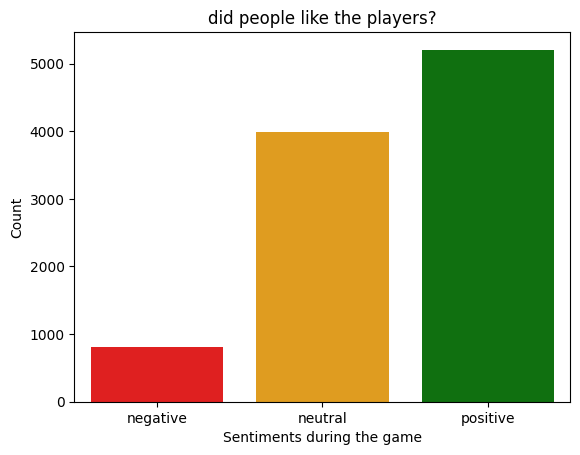

In [ ]:
sentiment = count_sentiment(result)

# plot a barchart using seaborn
ax = sns.barplot(
    x=list(sentiment.keys()),
    y = list(sentiment.values()),
    hue=['negative', 'neutral', 'positive'],
    palette={'negative': 'red', 'neutral': 'orange', 'positive': 'green'},
)
ax.set(
    xlabel='Sentiments during the game',
    ylabel='Count',
    title="Did people like the players?"
)

[Text(0.5, 0, 'Sentiments during the game'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Did people enjoy the match?')]

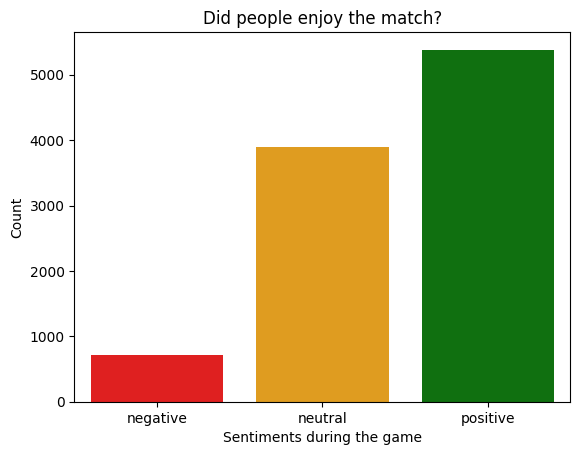

In [ ]:
sentiment2 = count_sentiment(result2)

ax = sns.barplot(
    x=list(sentiment2.keys()),
    y = list(sentiment2.values()),
    hue=['negative', 'neutral', 'positive'],
    palette={'negative': 'red', 'neutral': 'orange', 'positive': 'green'},
)
ax.set(
    xlabel='Sentiments during the game',
    ylabel='Count',
    title="Did people enjoy the match?",
)

*The bar plots show similar counts of sentiments between the two queries, where there are less than 1000 negative, around 4000 neutral, and more than 5000 positive sentiments from the tweets.*

#### Sentiment Analysis

*We get the average sentiment per player mentioned during the match to analyse the change in sentiment throughout the game.*

In [ ]:
df_players_player = get_data_per_player(result, tweets_on_date)
df_players_match = get_data_per_player(result2, tweets_on_date)

In [ ]:
# Player data with Query 1
df_players_player['Brady'].head(5)

,text,timestamp,sentiment_label,sentiment_score,mentioned
561902987111858177,At Publix last night and everyone was talking ...,2015-02-01 14:57:46-08:00,negative,0.926096,True
561912890039357442,Even Caroline hates the fucking cheaty Patriot...,2015-02-01 15:37:07-08:00,negative,0.953614,True
561968728876019712,“@reiko215: Tom Brady goin 4 💍 today #GoPatrio...,2015-02-01 19:19:00-08:00,neutral,0.623096,True
561956435009867776,The story on @ESPNNFL featuring the @MPTomahaw...,2015-02-01 18:30:09-08:00,positive,0.992369,True
561968178457083904,I'm not a Seahawk fan but will take them over ...,2015-02-01 19:16:49-08:00,negative,0.671647,True


In [ ]:
# Player data with Query 2
df_players_match['Brady'].head(5)

,text,timestamp,sentiment_label,sentiment_score,mentioned
561902987111858177,At Publix last night and everyone was talking ...,2015-02-01 14:57:46-08:00,negative,0.926096,True
561956435009867776,The story on @ESPNNFL featuring the @MPTomahaw...,2015-02-01 18:30:09-08:00,positive,0.992369,True
561974391115087872,"Deflated football in Donji Lapac, Croatia :) #...",2015-02-01 19:41:30-08:00,positive,0.790505,True
561940780148088835,So the greatest show on turf is nearly here! E...,2015-02-01 17:27:56-08:00,positive,0.979588,True
561968728876019712,“@reiko215: Tom Brady goin 4 💍 today #GoPatrio...,2015-02-01 19:19:00-08:00,neutral,0.623096,True


[Text(0.5, 0, 'Start time of each hour on the match day'),
 Text(0, 0.5, 'Hourly average sentiments'),
 Text(0.5, 1.0, 'Average Sentiments over Time per Player: \nDid people like the players?')]

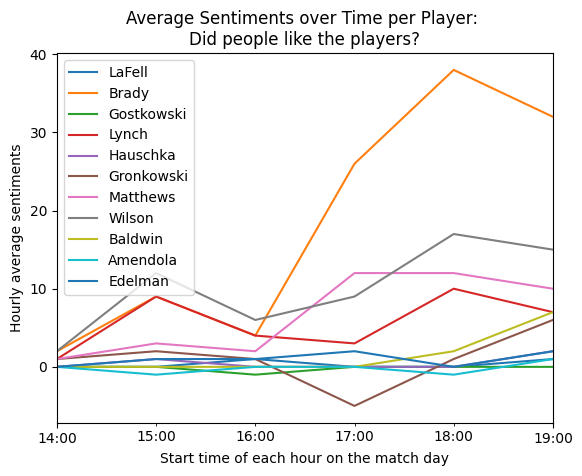

In [ ]:
# Average sentiment per hour during the match per player with Query 1
avg = {}
for player in Player:
    df = df_players_player[player.name]
    if not df.empty:
        df_agg = df.groupby(by=[pd.Grouper(key='timestamp', axis=0, freq='H'), 'sentiment_label']).text.count().unstack().fillna(0)
        if "positive" not in df_agg.columns:
            df_agg["positive"] = 0
        if "negative" not in df_agg.columns:
            df_agg["negative"] = 0
        df_agg["average"] = df_agg["positive"] - df_agg["negative"]
        avg[player.name] = df_agg["average"]

ax = pd.DataFrame(avg).fillna(0).plot()
ax.set(
    xlabel="Start time of each hour on the match day",
    ylabel="Hourly average sentiments",
    title="Average Sentiments over Time per Player: \nDid people like the players?",
)

[Text(0.5, 0, 'Start time of each hour on the match day'),
 Text(0, 0.5, 'Hourly average sentiments'),
 Text(0.5, 1.0, 'Average Sentiments over Time per Player: \nDid people enjoy the match?')]

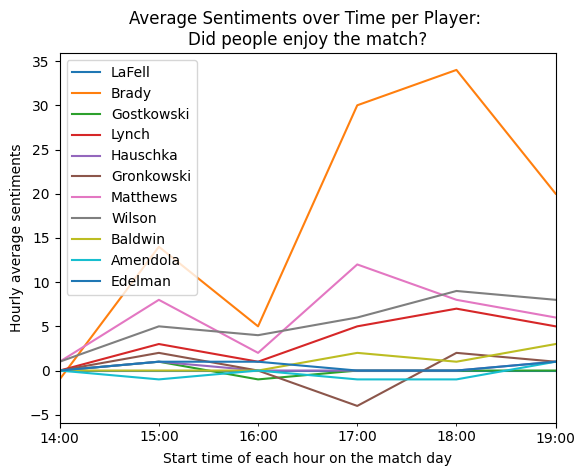

In [ ]:
# Average sentiment per hour during the match per player with Query 2
avg = {}
for player in Player:
    df = df_players_match[player.name]
    if not df.empty:
        df_agg = df.groupby(by=[pd.Grouper(key='timestamp', axis=0, freq='H'), 'sentiment_label']).text.count().unstack().fillna(0)
        if "positive" not in df_agg.columns:
            df_agg["positive"] = 0
        if "negative" not in df_agg.columns:
            df_agg["negative"] = 0
        df_agg["average"] = df_agg["positive"] - df_agg["negative"]
        avg[player.name] = df_agg["average"]

ax = pd.DataFrame(avg).fillna(0).plot()
ax.set(
    xlabel="Start time of each hour on the match day",
    ylabel="Hourly average sentiments",
    title="Average Sentiments over Time per Player: \nDid people enjoy the match?",
)

*The two plots above also show similar trends where there are*:
* *peaks between 3-4pm and 5-7pm for Brady;*
* *a common spike around 5-6pm for Matthews, and*
* *some higher average sentiment from the first query (query on the player) for Wilson around 3-4pm and 6-7pm.*

In [ ]:
scores_df

,type,time_remaining,team,quarter,yard,score,score_by,pass_from,kicker
0,TouchDown,0 days 00:09:47,Patriots,2,11,7,Brandon LaFell,Tom Brady,Stephen Gostkowski
1,TouchDown,0 days 00:02:16,Seahawks,2,3,7,Marshawn Lynch,None,Steven Hauschka
7,TouchDown,0 days 00:02:02,Patriots,2,3,7,Julian Edelman,Tom Brady,Stephen Gostkowski
2,TouchDown,0 days 00:00:31,Patriots,2,22,7,Rob Gronkowski,Tom Brady,Stephen Gostkowski
3,TouchDown,0 days 00:00:02,Seahawks,2,11,7,Chris Matthews,Russell Wilson,Steven Hauschka
4,FieldGoal,0 days 00:11:09,Seahawks,3,27,3,Steven Hauschka,None,None
5,TouchDown,0 days 00:04:54,Seahawks,3,3,7,Doug Baldwin,Russell Wilson,Steven Hauschka
6,TouchDown,0 days 00:07:55,Patriots,4,4,7,Danny Amendola,Tom Brady,Stephen Gostkowski



*Now let's look at the scoring data that was previously loaded. While we are not able to know the exact timestamp (as the data is only available in `time_reamining` for each quarter), we can make a fair guess that the peak around 3-4pm and 5-7pm could be related to the successful passes made by Brady in quarter 2 and 4.*

*This also helps us derive that, if we were to guess who would have won the MVP, the most likely player is Brady who had significantly higher positive sentiments during the match, with the actual scoring data backing up with many successful passes made by him.*

In [ ]:
import string
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [ ]:
def preprocess_text(text):
    text = text.lower()
    text = re.sub(f"[{re.escape(string.punctuation)}]", "", text)
    text = re.sub(r'\d+', '', text)
    text = text.strip()
    return text

df['text'] = df['text'].apply(preprocess_text)

vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df['text'])
y = df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

new_tweet = ["Patriots with another win! #patriots"]
new_tweet_processed = vectorizer.transform(new_tweet)
prediction = model.predict(new_tweet_processed)
print(f"Predicted fan group: {prediction[0]}")

random_tweets = df.sample(n=3, random_state=0)['text']
random_tweets_processed = vectorizer.transform(random_tweets)
predictions = model.predict(random_tweets_processed)

for tweet, pred in zip(random_tweets, predictions):
    print(f"Tweet: {tweet} -> Predicted fan group: {pred}")

              precision    recall  f1-score   support

       Hawks       1.00      1.00      1.00         1
    Patriots       1.00      1.00      1.00         1

    accuracy                           1.00         2
   macro avg       1.00      1.00      1.00         2
weighted avg       1.00      1.00      1.00         2

Predicted fan group: Patriots
Tweet: hawks for the win gohawks -> Predicted fan group: Hawks
Tweet: the patriots are on fire this season patriots -> Predicted fan group: Patriots
Tweet: go hawks gohawks -> Predicted fan group: Hawks
